In [1]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy as sp
import scipy.io
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
# import scrublet as scr
# import diffxpy.api as de
# import gseapy
import gc

# sc.settings.verbosity = 3
# sc.logging.print_versions()

### Analyze data

In [2]:
merged_data = sc.read('/local/home/am/EX_M/datasets/scRNA/merged/bone_marrow.h5ad')
merged_data

AnnData object with n_obs × n_vars = 339381 × 16723
    obs: 'dataset', 'sample', 'donor_status', 'donor', 'timepoint', 'celltype'
    uns: 'celltype_colors', 'dataset_colors', 'neighbors', 'timepoint_colors', 'umap'
    obsm: 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [5]:
# find percentage of each cell type
celltype_counts = merged_data.obs['celltype'].value_counts()
celltype_percentage = celltype_counts / celltype_counts.sum() * 100
celltype_percentage

celltype
HSC.MPP           22.302073
CD14.Mono         15.220946
GMP               11.304994
CD4.N              8.243537
CD4.M              7.554636
CD8.M              6.401655
Late.Eryth         5.588704
MEP                5.187091
cDC                3.686712
NK                 3.250624
CD8.N              2.760320
B                  2.659253
CD16.Mono          1.922913
CLP                1.255226
pDC                1.105542
Pre.B              0.714536
Plasma             0.700687
Megakaryocytes     0.111085
Mesenchymal        0.029465
Name: count, dtype: float64

In [ ]:
# merged_data.obs['CD36_Availability'] = merged_data.X[:, 6439].toarray().flatten()

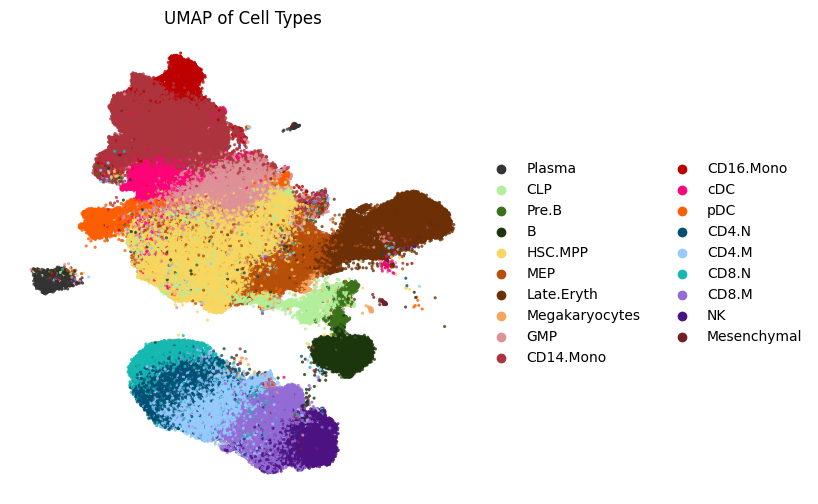

In [44]:
plt.close('all')
fig, ax = plt.subplots(figsize=(6, 6))

# Plot UMAP
sc.pl.umap(
    merged_data,
    color=['celltype'],
    size=20,
    alpha=0.8,
    frameon=False,
    title="UMAP of Cell Types",
    ax=ax,
    show=False  # Prevent auto-display
)

# Save the figure
plt.savefig("./umap_plot.pdf", format="pdf", dpi=300, bbox_inches='tight')
plt.show()

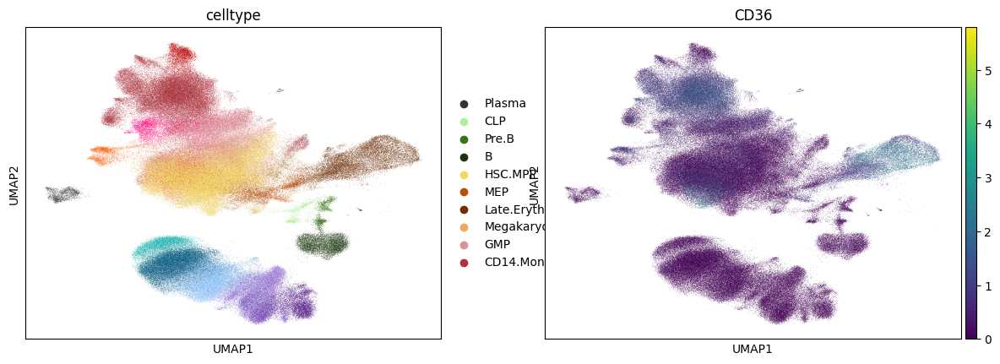

In [45]:
sc.pl.umap(merged_data, color=['celltype', 'CD36'], ncols=2);

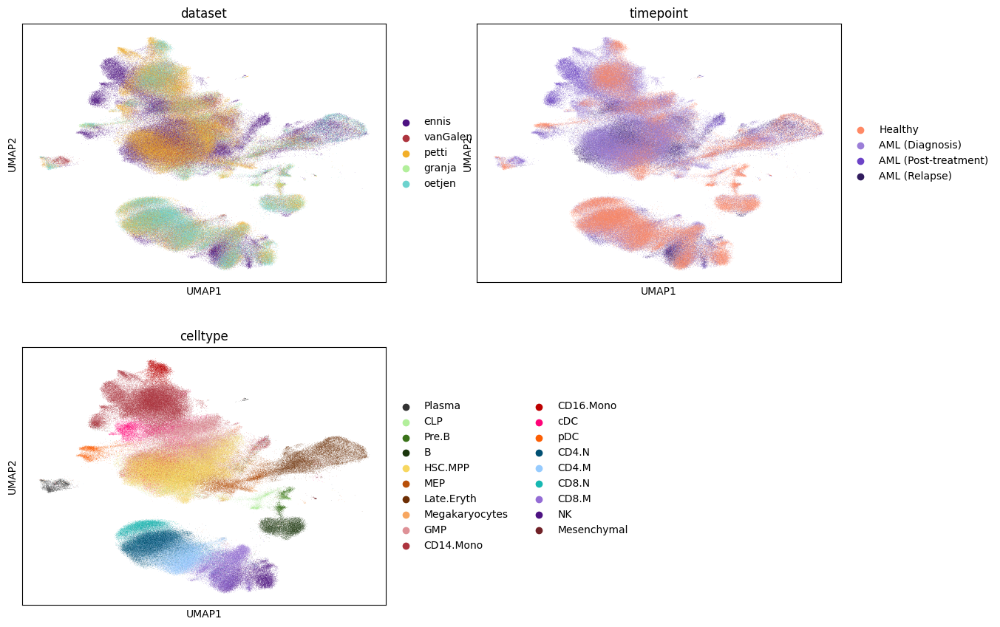

In [46]:
sc.pl.umap(merged_data, color=['dataset', 'timepoint', 'celltype'], ncols=2);

#### T-test

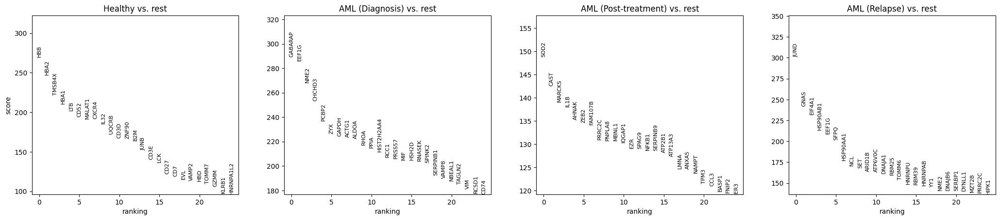

In [4]:
sc.tl.rank_genes_groups(merged_data, 'timepoint', method='t-test', key_added = "t-test")
sc.pl.rank_genes_groups(merged_data, n_genes=25, sharey=False, key = "t-test")

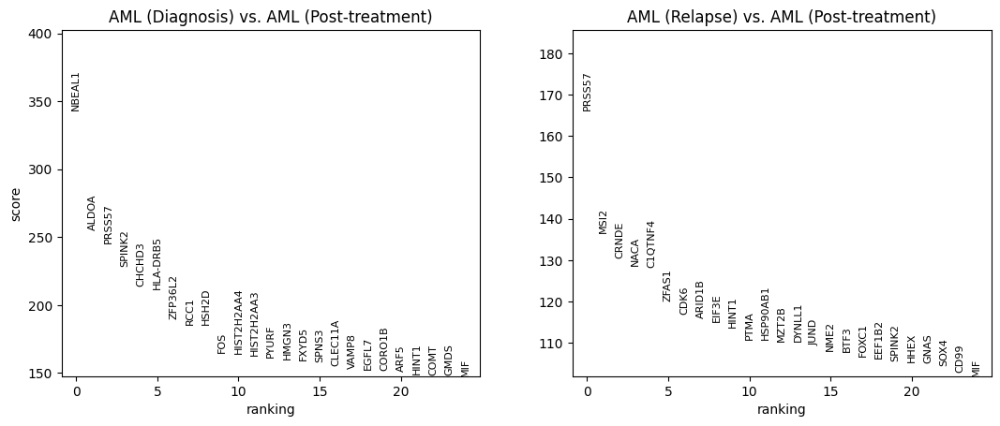

In [5]:
sc.tl.rank_genes_groups(merged_data, 'timepoint', method='t-test', key_added = "t-test", groups=["AML (Diagnosis)", "AML (Post-treatment)", "AML (Relapse)"],
                        reference="AML (Post-treatment)")
sc.pl.rank_genes_groups(merged_data, n_genes=25, sharey=False, key = "t-test")

#### T-test overestimated_variance

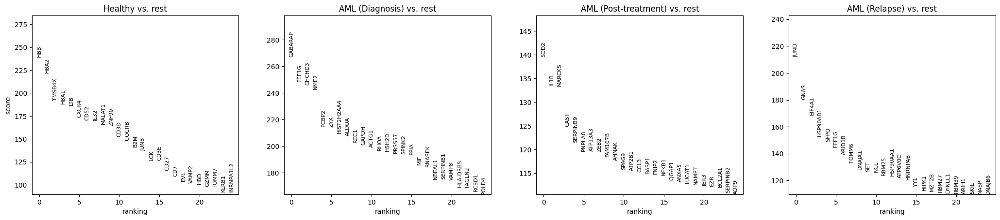

In [6]:
sc.tl.rank_genes_groups(merged_data, 'timepoint', method='t-test_overestim_var', key_added = "t-test_ov")
sc.pl.rank_genes_groups(merged_data, n_genes=25, sharey=False, key = "t-test_ov")

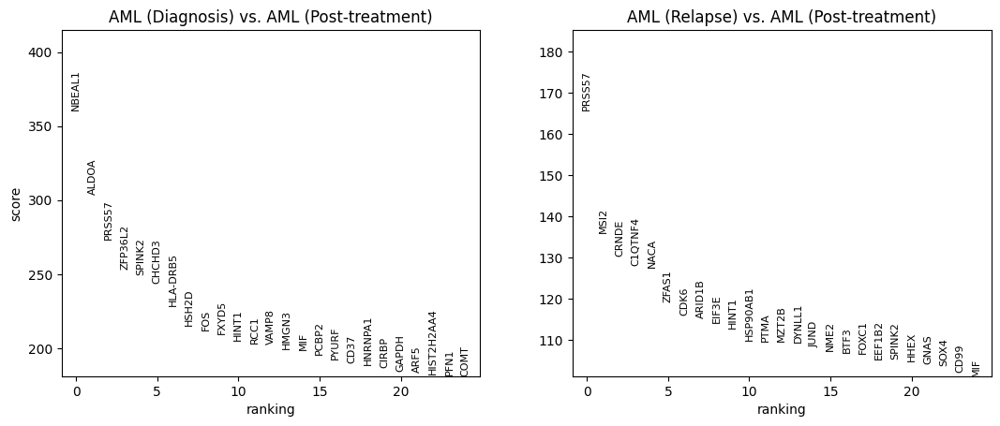

In [7]:
sc.tl.rank_genes_groups(merged_data, 'timepoint', method='t-test_overestim_var', key_added = "t-test_ov", groups=["AML (Diagnosis)", "AML (Post-treatment)", "AML (Relapse)"],
                        reference="AML (Post-treatment)")
sc.pl.rank_genes_groups(merged_data, n_genes=25, sharey=False, key = "t-test_ov")

#### Wilcoxon rank-sum

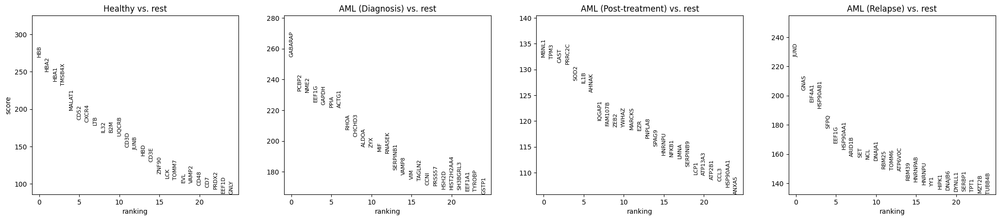

In [8]:
sc.tl.rank_genes_groups(merged_data, 'timepoint', method='wilcoxon', key_added = "wilcoxon")
sc.pl.rank_genes_groups(merged_data, n_genes=25, sharey=False, key="wilcoxon")

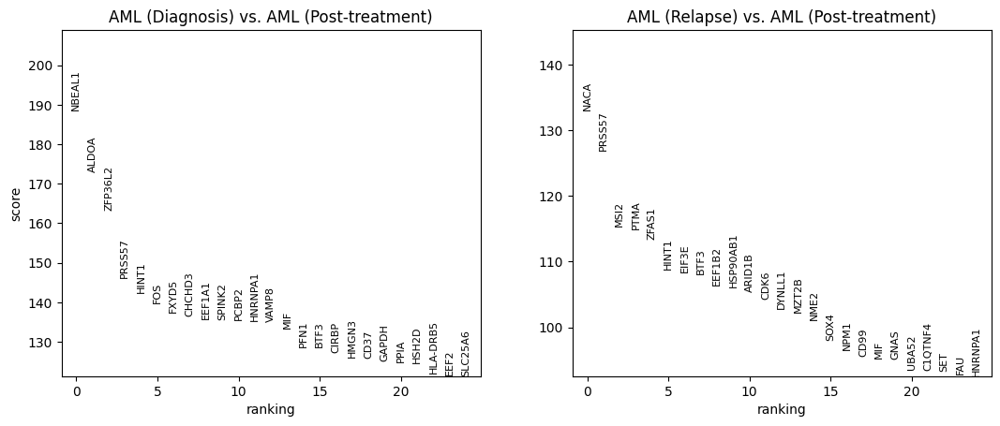

In [9]:
sc.tl.rank_genes_groups(merged_data, 'timepoint', method='wilcoxon', key_added = "wilcoxon-2", groups=["AML (Diagnosis)", "AML (Post-treatment)", "AML (Relapse)"],
                        reference="AML (Post-treatment)")
sc.pl.rank_genes_groups(merged_data, n_genes=25, sharey=False, key="wilcoxon-2")

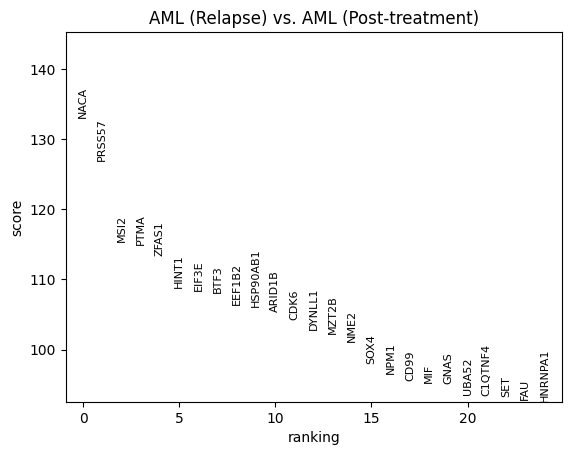

In [10]:
sc.tl.rank_genes_groups(merged_data, 'timepoint', method='wilcoxon', key_added = "wilcoxon-3", groups=["AML (Post-treatment)", "AML (Relapse)"],
                        reference="AML (Post-treatment)")
sc.pl.rank_genes_groups(merged_data, n_genes=25, sharey=False, key="wilcoxon-3")

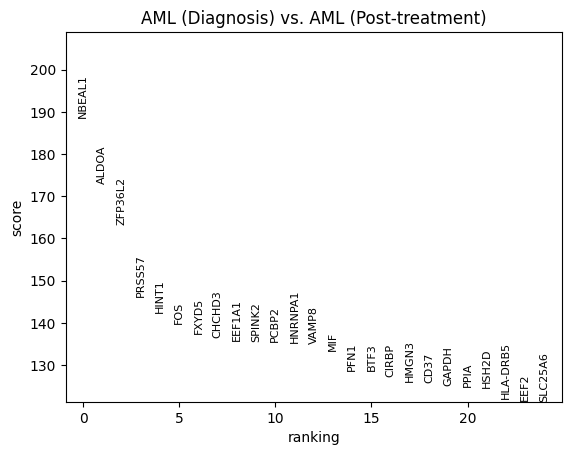

In [11]:
sc.tl.rank_genes_groups(merged_data, 'timepoint', method='wilcoxon', key_added = "wilcoxon-4", groups=["AML (Post-treatment)", "AML (Diagnosis)"],
                        reference="AML (Post-treatment)")
sc.pl.rank_genes_groups(merged_data, n_genes=25, sharey=False, key="wilcoxon-4")

#### Logistic regression test

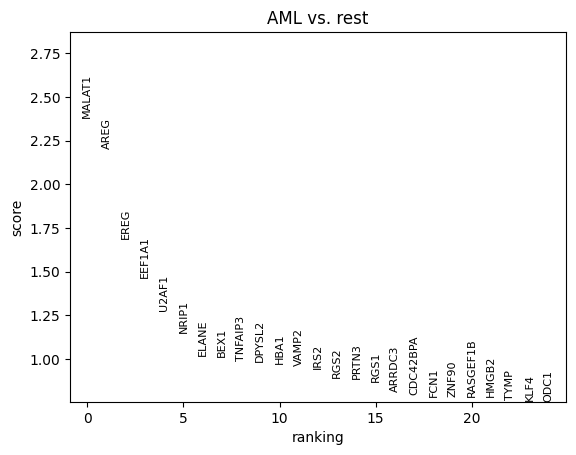

In [12]:
sc.tl.rank_genes_groups(merged_data, 'donor_status', method='logreg',key_added = "logreg", groups=['AML', 'Healthy'])
sc.pl.rank_genes_groups(merged_data, n_genes=25, sharey=False, key = "logreg")

#### wilcoxon results

         Falling back to preprocessing with `sc.pp.pca` and default params.


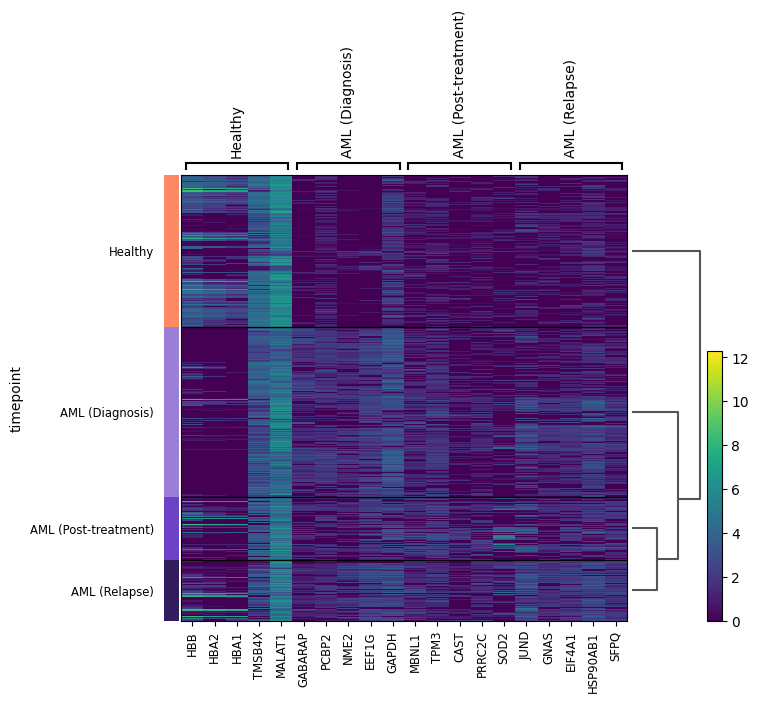

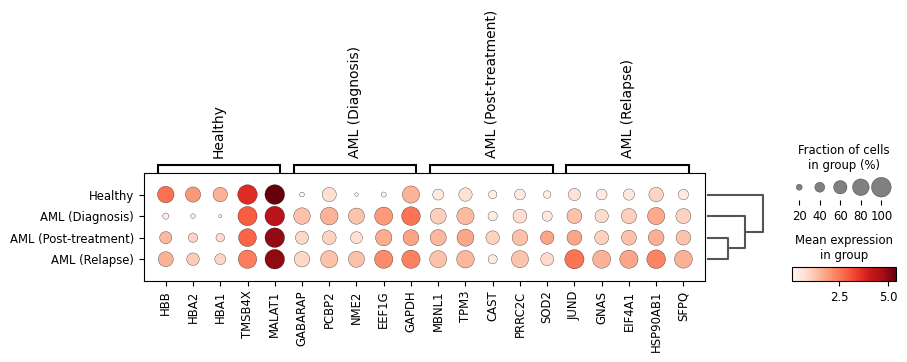

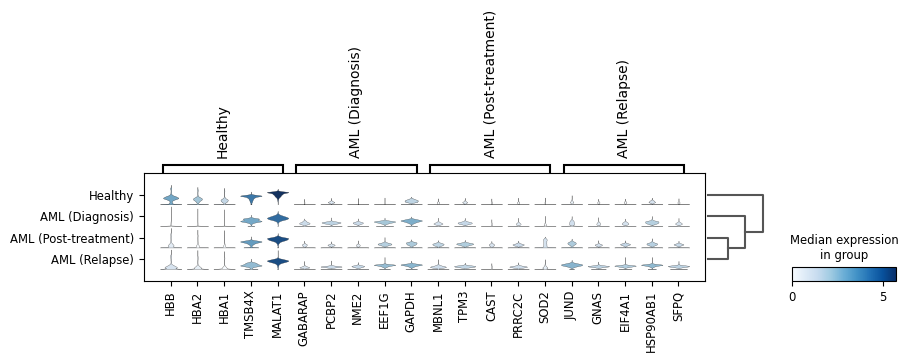

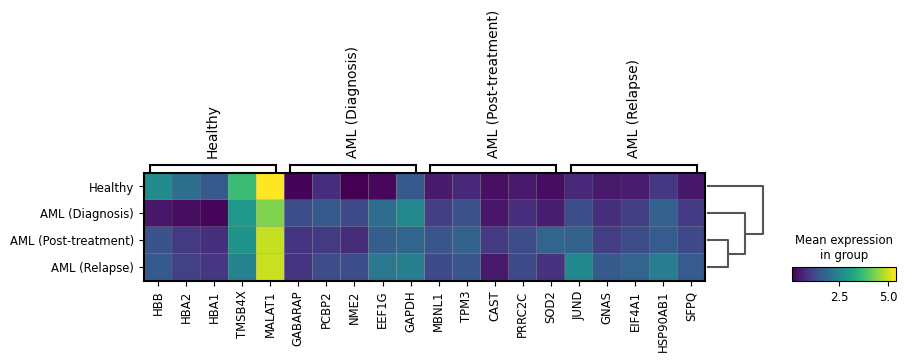

In [13]:
sc.pl.rank_genes_groups_heatmap(merged_data, n_genes=5, key="wilcoxon", groupby="timepoint", show_gene_labels=True)
sc.pl.rank_genes_groups_dotplot(merged_data, n_genes=5, key="wilcoxon", groupby="timepoint")
sc.pl.rank_genes_groups_stacked_violin(merged_data, n_genes=5, key="wilcoxon", groupby="timepoint")
sc.pl.rank_genes_groups_matrixplot(merged_data, n_genes=5, key="wilcoxon", groupby="timepoint")

#### GO Enrichment

In [14]:
gene_set_names = gseapy.get_library_name(organism='Human')
print(gene_set_names)

['ARCHS4_Cell-lines', 'ARCHS4_IDG_Coexp', 'ARCHS4_Kinases_Coexp', 'ARCHS4_TFs_Coexp', 'ARCHS4_Tissues', 'Achilles_fitness_decrease', 'Achilles_fitness_increase', 'Aging_Perturbations_from_GEO_down', 'Aging_Perturbations_from_GEO_up', 'Allen_Brain_Atlas_10x_scRNA_2021', 'Allen_Brain_Atlas_down', 'Allen_Brain_Atlas_up', 'Azimuth_2023', 'Azimuth_Cell_Types_2021', 'BioCarta_2013', 'BioCarta_2015', 'BioCarta_2016', 'BioPlanet_2019', 'BioPlex_2017', 'CCLE_Proteomics_2020', 'CORUM', 'COVID-19_Related_Gene_Sets', 'COVID-19_Related_Gene_Sets_2021', 'Cancer_Cell_Line_Encyclopedia', 'CellMarker_2024', 'CellMarker_Augmented_2021', 'ChEA_2013', 'ChEA_2015', 'ChEA_2016', 'ChEA_2022', 'Chromosome_Location', 'Chromosome_Location_hg19', 'ClinVar_2019', 'DSigDB', 'Data_Acquisition_Method_Most_Popular_Genes', 'DepMap_WG_CRISPR_Screens_Broad_CellLines_2019', 'DepMap_WG_CRISPR_Screens_Sanger_CellLines_2019', 'Descartes_Cell_Types_and_Tissue_2021', 'Diabetes_Perturbations_GEO_2022', 'DisGeNET', 'Disease_Per

In [15]:
glist1 = sc.get.rank_genes_groups_df(merged_data, group='AML (Relapse)', key='wilcoxon-3', log2fc_min=0.25, pval_cutoff=0.05)['names'].squeeze().str.strip().tolist()

In [16]:
glist2 = sc.get.rank_genes_groups_df(merged_data, group='AML (Diagnosis)', key='wilcoxon-4', log2fc_min=0.25, pval_cutoff=0.05)['names'].squeeze().str.strip().tolist()

In [17]:
enr_res1 = gseapy.enrichr(gene_list=glist1, organism='Human', gene_sets='GO_Biological_Process_2018', cutoff = 0.5)
enr_res1.results.head()

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,GO_Biological_Process_2018,"mRNA splicing, via spliceosome (GO:0000398)",184/261,8.425257e-48,4.049178e-44,0,0,6.486664,703.107948,DBR1;PDCD7;EIF4A3;WDR83;HNRNPR;CWC25;CWC27;CCA...
1,GO_Biological_Process_2018,mRNA processing (GO:0006397),194/283,2.203621e-47,5.295302e-44,0,0,5.923285,636.346733,EIF4A3;WDR83;HNRNPR;CCAR1;PNN;SNRPD2;RAVER1;CL...
2,GO_Biological_Process_2018,"RNA splicing, via transesterification reaction...",170/236,2.550152e-46,4.085344e-43,0,0,6.978911,732.665319,DBR1;PDCD7;EIF4A3;WDR83;HNRNPR;CWC25;CWC27;CCA...
3,GO_Biological_Process_2018,translational elongation (GO:0006414),82/105,4.364470e-27,5.243911e-24,0,0,9.531164,578.506379,MRPS17;MRPS15;MRPS16;MRPS11;MRPS12;MRPL38;MRPL...
4,GO_Biological_Process_2018,translational termination (GO:0006415),77/96,6.541812e-27,5.750620e-24,0,0,10.827202,652.789164,MRPS17;MRPS15;MRPS16;MRPS11;MRPS12;MRPL38;MRPL...


In [18]:
enr_res2 = gseapy.enrichr(gene_list=glist2, organism='Human', gene_sets='GO_Biological_Process_2018', cutoff = 0.5)
enr_res2.results.head()

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,GO_Biological_Process_2018,mitochondrial translation (GO:0032543),73/107,5.305523e-19,1.407245e-15,0,0,5.888960,247.809616,MRPS15;MRPS16;MRPS14;MRPS11;MRPS12;MRPL38;MRPL...
1,GO_Biological_Process_2018,translational elongation (GO:0006414),72/105,5.910310e-19,1.407245e-15,0,0,5.983583,251.145450,MRPS15;MRPS16;MRPS14;MRPS11;MRPS12;MRPL38;MRPL...
2,GO_Biological_Process_2018,mitochondrial translational elongation (GO:007...,63/87,1.135828e-18,1.802938e-15,0,0,7.191268,297.137206,MRPS15;MRPS16;MRPS14;MRPS11;MRPS12;MRPL38;MRPL...
3,GO_Biological_Process_2018,translational termination (GO:0006415),67/96,2.247923e-18,2.676152e-15,0,0,6.331847,257.304265,N6AMT1;MRPS15;MRPS16;MRPS14;MRPS11;MRPS12;MRPL...
4,GO_Biological_Process_2018,mitochondrial translational termination (GO:00...,63/89,7.442499e-18,7.088236e-15,0,0,6.637183,261.766022,MRPS15;MRPS16;MRPS14;MRPS11;MRPS12;MRPL38;MRPL...


c:\Users\User\Desktop\MscThesis\venv\lib\site-packages\gseapy\plot.py:689: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df[self.colname].replace(
c:\Users\User\Desktop\MscThesis\venv\lib\site-packages\gseapy\plot.py:689: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[self.colname].replace(


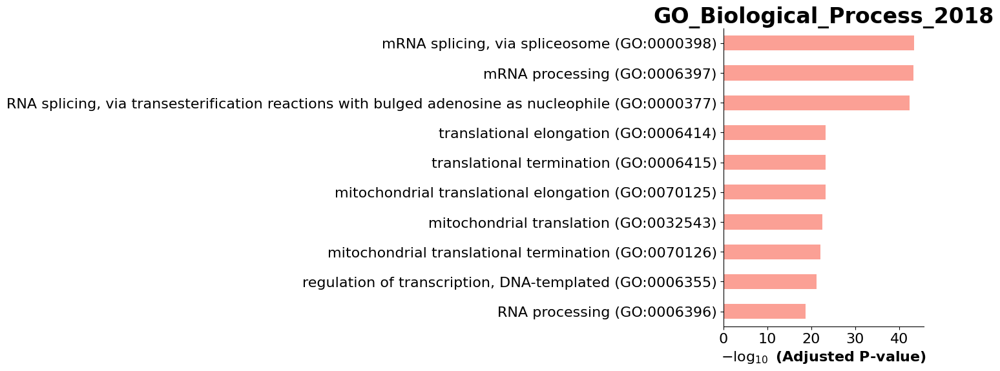

In [19]:
gseapy.barplot(enr_res1.res2d,title='GO_Biological_Process_2018');

c:\Users\User\Desktop\MscThesis\venv\lib\site-packages\gseapy\plot.py:689: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df[self.colname].replace(
c:\Users\User\Desktop\MscThesis\venv\lib\site-packages\gseapy\plot.py:689: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[self.colname].replace(


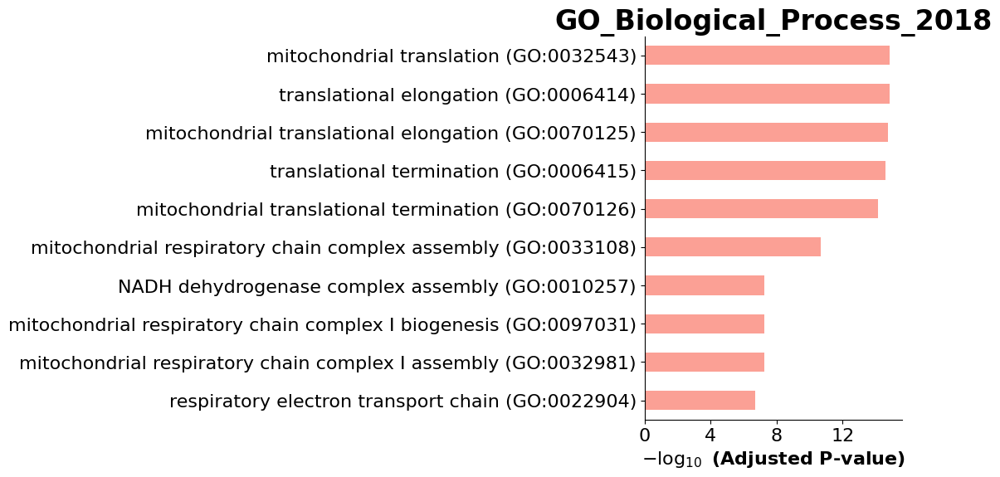

In [20]:
gseapy.barplot(enr_res2.res2d,title='GO_Biological_Process_2018');

### Analyze granja

In [21]:
gran = sc.read('../../../datasets/granja/granja.h5ad')
gran.obs['dataset'] = 'granja'
gran.obs['sample'] = gran.obs['Group']
gran.obs['donor'] = gran.obs['sample'].str.extract(r'(_D[1-3])')[0].str.extract(r'(D[1-3])')
gran.obs['timepoint'] = 'Healthy'
# gran.X = gran.layers['counts'].copy()
gran.obsm['X_umap'] = np.array(gran.obs[['UMAP1', 'UMAP2']].values, dtype='float32')
gran

AnnData object with n_obs × n_vars = 20558 × 20287
    obs: 'Group', 'nUMI_pre', 'nUMI', 'nGene', 'initialClusters', 'UMAP1', 'UMAP2', 'Clusters', 'BioClassification', 'Barcode', 'bc', 'ADT_CD10', 'ADT_CD123', 'ADT_CD14', 'ADT_CD19', 'ADT_CD3', 'ADT_CD33', 'ADT_CD34', 'ADT_CD38', 'ADT_CD4', 'ADT_CD45RA', 'ADT_CD7', 'ADT_CD8A', 'ADT_CD90', 'ADT_CD15', 'ADT_CD16', 'ADT_CD56', 'ADT_CD25', 'ADT_CD45RO', 'ADT_PD.1', 'ADT_TIGIT', 'ADT_CD127', 'celltype', 'dataset', 'sample', 'donor', 'timepoint'
    uns: 'BioClassification_colors', 'celltype_colors', 'log1p', 'rank_genes_unk'
    obsm: 'X_umap'
    layers: 'counts'

In [22]:
retrieved_gran = merged_data[merged_data.obs['dataset'] == 'granja']
retrieved_gran

View of AnnData object with n_obs × n_vars = 20344 × 16723
    obs: 'dataset', 'sample', 'donor_status', 'donor', 'timepoint', 'celltype'
    uns: 'celltype_colors', 'dataset_colors', 'neighbors', 'timepoint_colors', 'umap', 't-test', 't-test_ov', 'wilcoxon', 'wilcoxon-2', 'wilcoxon-3', 'wilcoxon-4', 'logreg', 'dendrogram_timepoint'
    obsm: 'X_umap', 'X_pca'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

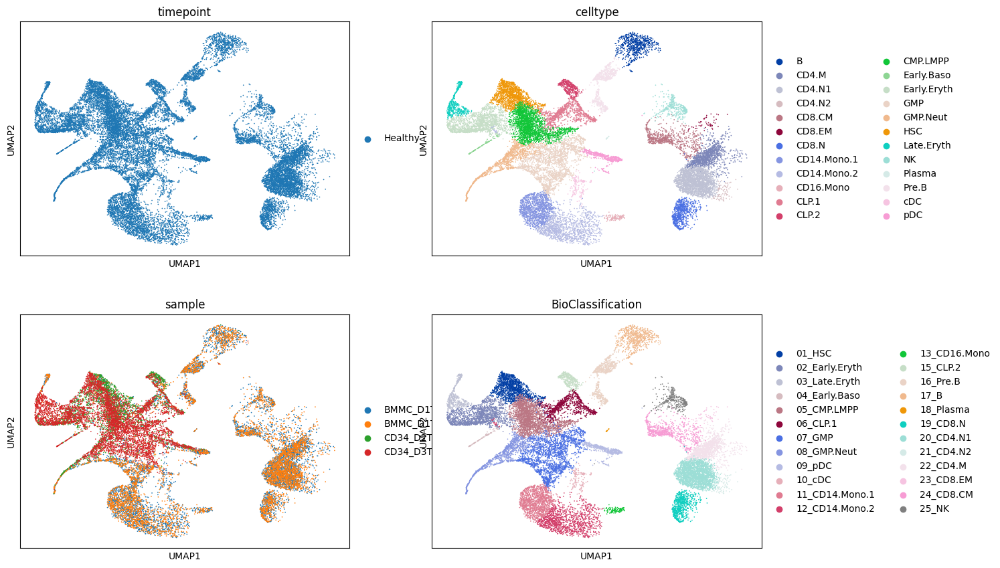

In [23]:
sc.pl.umap(gran, color=['timepoint', 'celltype', 'sample', 'BioClassification'], ncols=2)

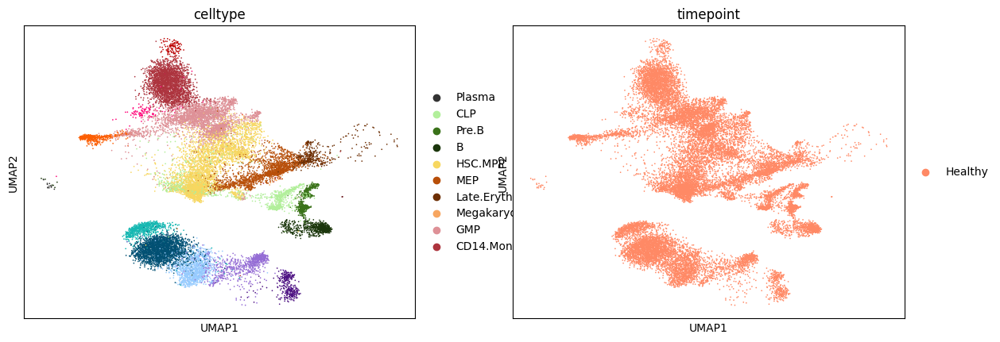

In [24]:
sc.pl.umap(retrieved_gran, color=['celltype', 'timepoint'], ncols=2);

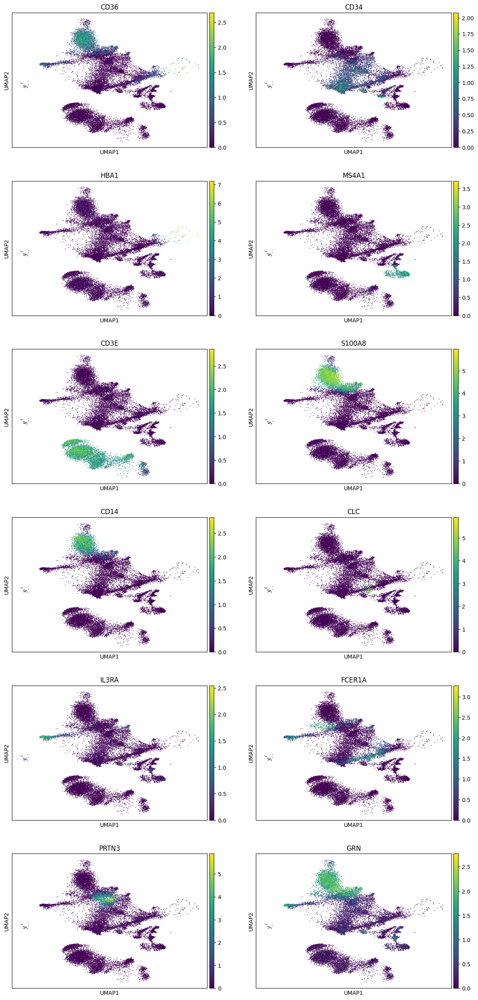

In [25]:
sc.pl.umap(retrieved_gran, color=['CD36', 'CD34', 'HBA1', 'MS4A1', 'CD3E', 'S100A8',
                         'CD14', 'CLC', 'IL3RA', 'FCER1A','PRTN3', 'GRN'], ncols=2)

In [26]:
retrieved_gran.obs['celltype'].value_counts()

celltype
HSC.MPP           3666
GMP               3080
CD14.Mono         2571
CD4.N             2462
MEP               1736
CLP               1253
CD4.M             1217
CD8.M              784
CD8.N              733
Pre.B              693
B                  658
pDC                475
Late.Eryth         406
NK                 344
cDC                119
CD16.Mono          114
Megakaryocytes      18
Plasma              12
Mesenchymal          3
Name: count, dtype: int64

In [27]:
retrieved_gran.obs['donor'].value_counts()

donor
D1    12229
D3     5696
D2     2419
Name: count, dtype: int64

In [28]:
retrieved_gran.obs['donor_status'].value_counts()

donor_status
Healthy    20344
Name: count, dtype: int64

In [29]:
del gran, retrieved_gran
gc.collect();

### Analyze vanG

In [96]:
vang = sc.read('../../../datasets/van_Galen/van_Galen.h5ad')
vang.obs['timepoint'] = vang.obs['sample'].str.extract(r'(D[0-9]+$)')
vang.obs['dataset'] = 'vanGalen'
tp = np.array(vang.obs['timepoint'])
tp[vang.obs['donor_status'] == 'healthy'] = 'Healthy'
vang.obs['timepoint'] = tp
# vang.X = vang.layers['counts'].copy()
vang

AnnData object with n_obs × n_vars = 38410 × 27899
    obs: 'NumberOfReads', 'AlignedToGenome', 'AlignedToTranscriptome', 'TranscriptomeUMIs', 'NumberOfGenes', 'CyclingScore', 'CyclingBinary', 'MutTranscripts', 'WtTranscripts', 'PredictionRF2', 'cell_status', 'CellType', 'Score_HSC', 'Score_Prog', 'Score_GMP', 'Score_ProMono', 'Score_Mono', 'Score_cDC', 'Score_pDC', 'Score_earlyEry', 'Score_lateEry', 'Score_ProB', 'Score_B', 'Score_Plasma', 'Score_T', 'Score_CTL', 'Score_NK', 'NanoporeTranscripts', 'sample_ID', 'dataset', 'sample', 'donor', 'donor_status', 'celltype', 'timepoint'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'CellType_colors', 'celltype_colors', 'donor_colors', 'hvg', 'log1p', 'neighbors', 'pca', 'sample_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [97]:
retrieved_vang = merged_data[merged_data.obs['dataset'] == 'vanGalen']
retrieved_vang

View of AnnData object with n_obs × n_vars = 38019 × 16723
    obs: 'dataset', 'sample', 'donor_status', 'donor', 'timepoint', 'celltype'
    uns: 'celltype_colors', 'dataset_colors', 'neighbors', 'timepoint_colors', 'umap', 't-test', 't-test_ov', 'wilcoxon', 'wilcoxon-2', 'wilcoxon-3', 'wilcoxon-4', 'logreg', 'dendrogram_timepoint'
    obsm: 'X_umap', 'X_pca'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

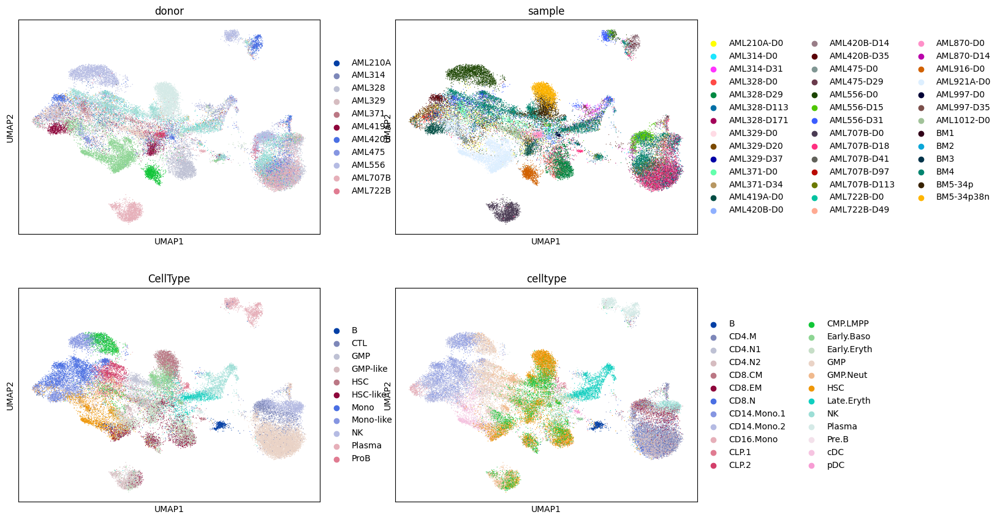

In [98]:
sc.pl.umap(vang, color=['donor', 'sample', 'CellType', 'celltype'], ncols=2)

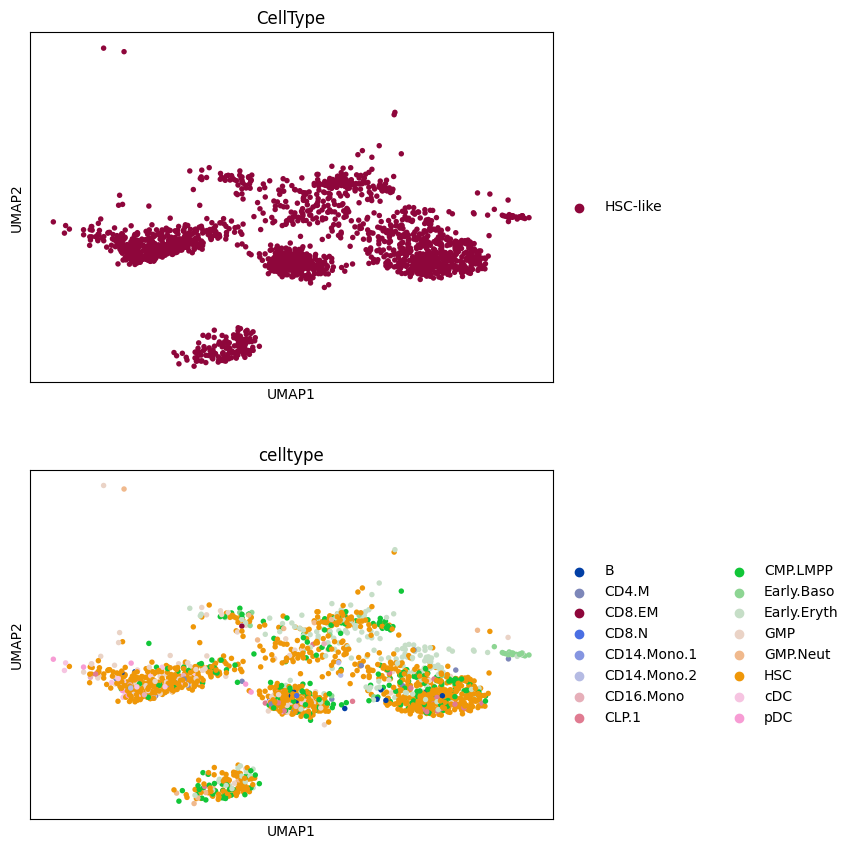

In [99]:
sc.pl.umap(vang[vang.obs['CellType'] == "HSC-like"], color=['CellType', 'celltype'], ncols=1);

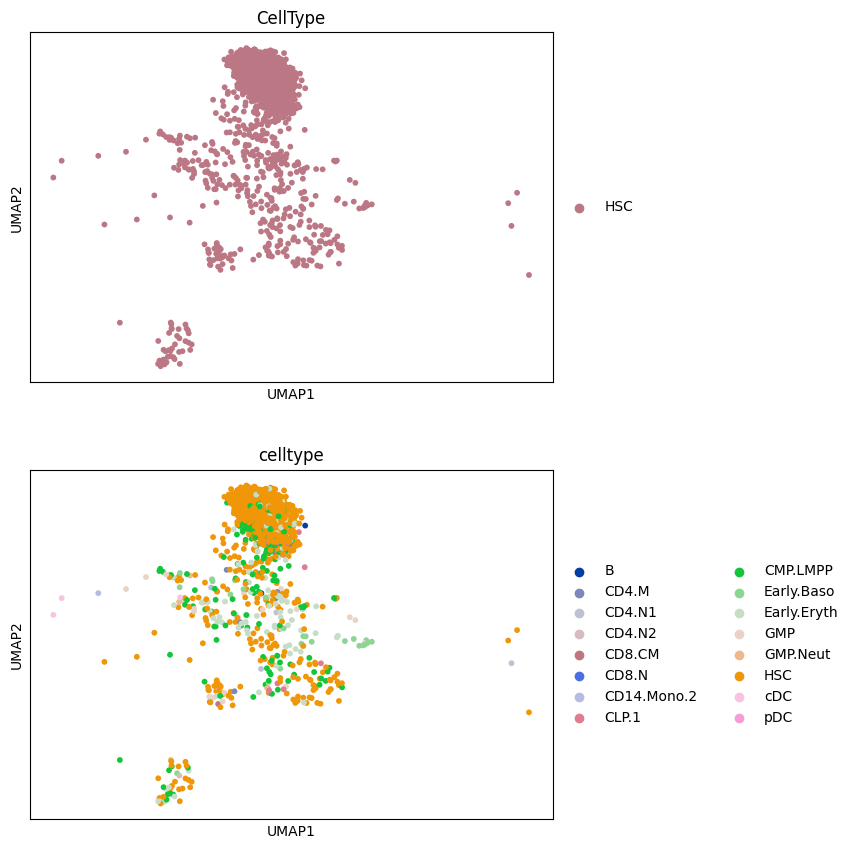

In [100]:
sc.pl.umap(vang[vang.obs['CellType'] == "HSC"], color=['CellType', 'celltype'], ncols=1);

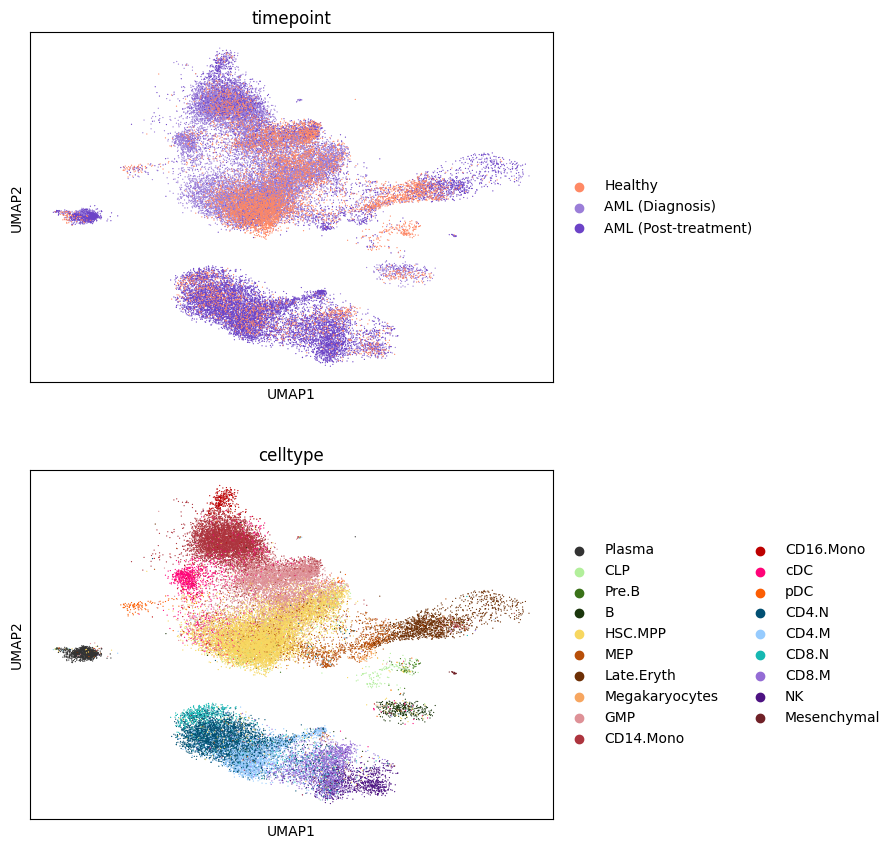

In [101]:
sc.pl.umap(retrieved_vang, color=['timepoint', 'celltype'], ncols=1);

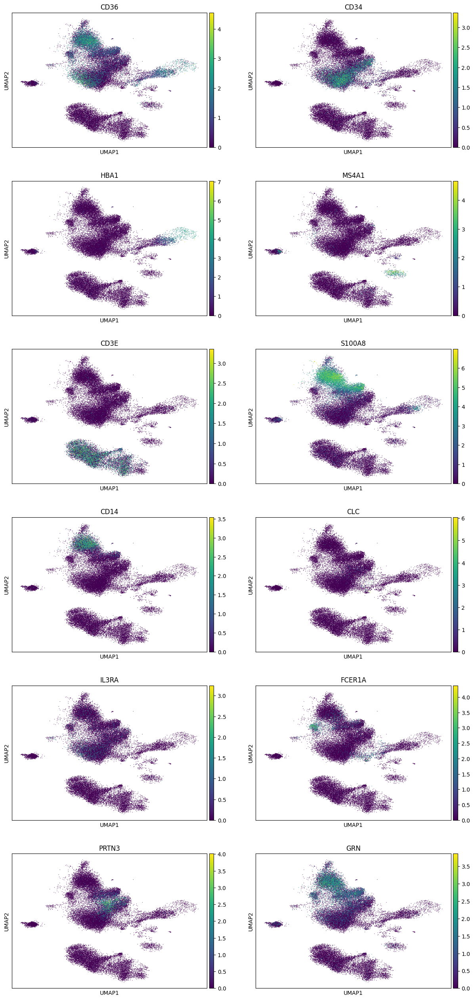

In [102]:
sc.pl.umap(retrieved_vang, color=['CD36', 'CD34', 'HBA1', 'MS4A1', 'CD3E', 'S100A8',
                         'CD14', 'CLC', 'IL3RA', 'FCER1A','PRTN3', 'GRN'], ncols=2)

In [103]:
retrieved_vang.obs['donor_status'].value_counts()

donor_status
AML        30353
Healthy     7666
Name: count, dtype: int64

In [104]:
retrieved_vang.obs['celltype'].value_counts()

celltype
HSC.MPP           9876
GMP               5851
CD14.Mono         5483
CD4.N             3763
CD4.M             2880
CD8.M             1626
MEP               1587
Late.Eryth        1538
cDC               1172
Plasma            1072
NK                 933
CD8.N              725
CD16.Mono          434
CLP                380
B                  365
pDC                196
Megakaryocytes      67
Pre.B               54
Mesenchymal         17
Name: count, dtype: int64

#### T-test

In [39]:
# sc.tl.rank_genes_groups(vang, 'CellType', method='t-test', key_added = "t-test-up", groups=['HSC', 'HSC-like'])
# sc.pl.rank_genes_groups(vang, n_genes=25, sharey=False, key = "t-test-up")

c:\Users\User\Desktop\MscThesis\venv\lib\site-packages\scanpy\tools\_rank_genes_groups.py:640: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


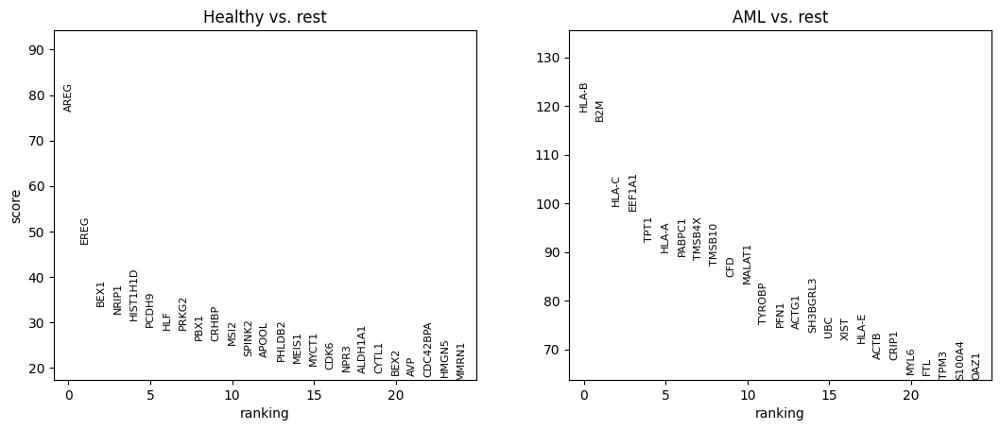

In [40]:
sc.tl.rank_genes_groups(retrieved_vang, 'donor_status', method='t-test', key_added = "t-test", groups=['Healthy', 'AML'])
sc.pl.rank_genes_groups(retrieved_vang, n_genes=25, sharey=False, key = "t-test")

#### T-test overestimated_variance

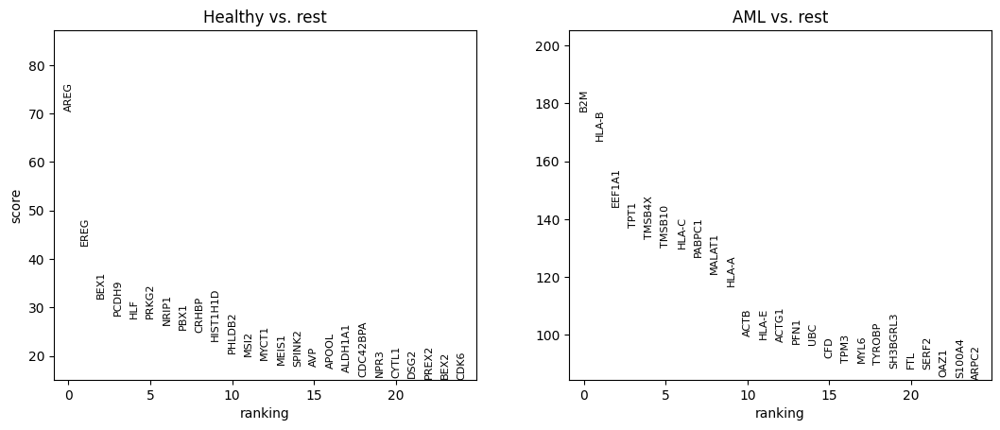

In [41]:
sc.tl.rank_genes_groups(retrieved_vang, 'donor_status', method='t-test_overestim_var', key_added = "t-test_ov", groups=['Healthy', 'AML'])
sc.pl.rank_genes_groups(retrieved_vang, n_genes=25, sharey=False, key = "t-test_ov")

#### Wilcoxon rank-sum

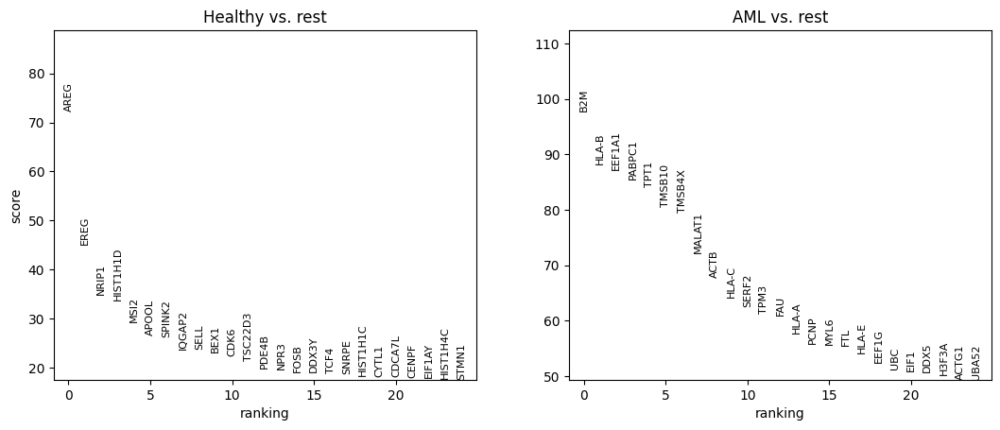

In [42]:
sc.tl.rank_genes_groups(retrieved_vang, 'donor_status', method='wilcoxon', key_added = "wilcoxon", groups=['Healthy', 'AML'])
sc.pl.rank_genes_groups(retrieved_vang, n_genes=25, sharey=False, key="wilcoxon")

#### Logistic regression test

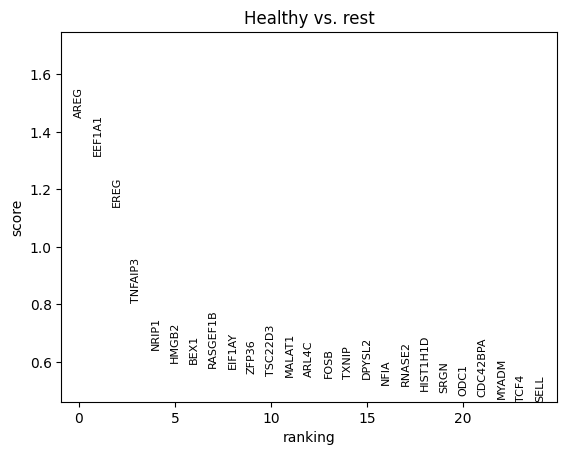

In [43]:
sc.tl.rank_genes_groups(retrieved_vang, 'donor_status', method='logreg',key_added = "logreg", groups=['Healthy', 'AML'])
sc.pl.rank_genes_groups(retrieved_vang, n_genes=25, sharey=False, key = "logreg")

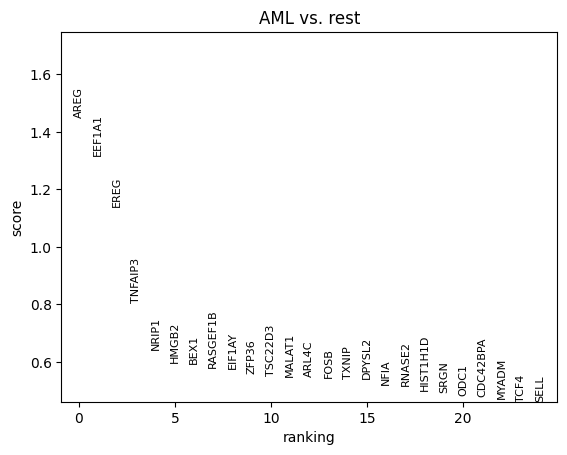

In [44]:
sc.tl.rank_genes_groups(retrieved_vang, 'donor_status', method='logreg',key_added = "logreg", groups=['AML', 'Healthy'])
sc.pl.rank_genes_groups(retrieved_vang, n_genes=25, sharey=False, key = "logreg")

#### wilcoxon results

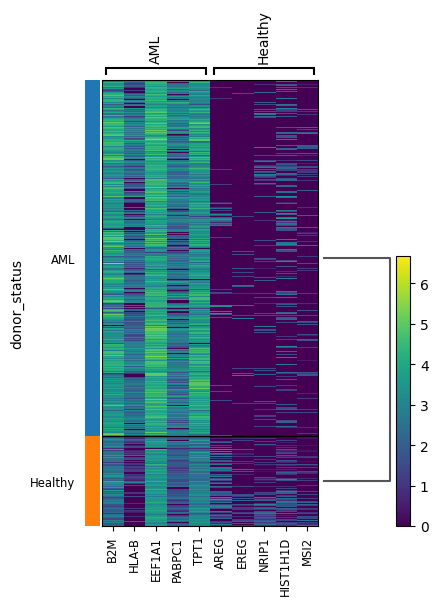

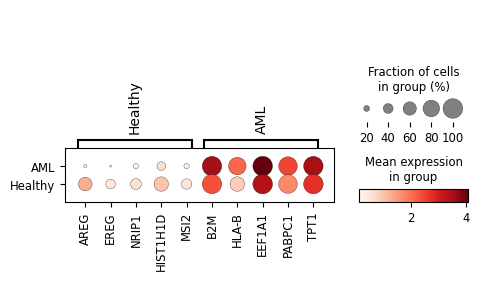

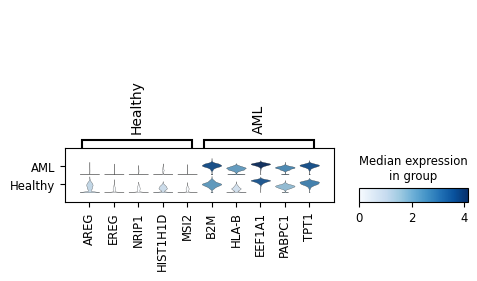

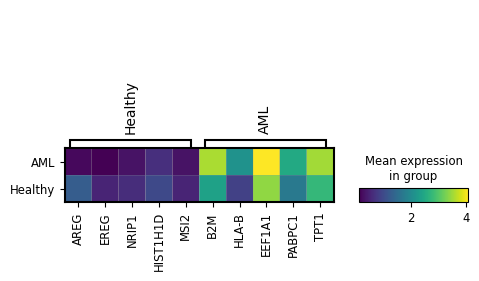

In [45]:
sc.pl.rank_genes_groups_heatmap(retrieved_vang, n_genes=5, key="wilcoxon", groupby="donor_status", show_gene_labels=True)
sc.pl.rank_genes_groups_dotplot(retrieved_vang, n_genes=5, key="wilcoxon", groupby="donor_status")
sc.pl.rank_genes_groups_stacked_violin(retrieved_vang, n_genes=5, key="wilcoxon", groupby="donor_status")
sc.pl.rank_genes_groups_matrixplot(retrieved_vang, n_genes=5, key="wilcoxon", groupby="donor_status")

#### GO Enrichment

In [46]:
gene_set_names = gseapy.get_library_name(organism='Human')
print(gene_set_names)

['ARCHS4_Cell-lines', 'ARCHS4_IDG_Coexp', 'ARCHS4_Kinases_Coexp', 'ARCHS4_TFs_Coexp', 'ARCHS4_Tissues', 'Achilles_fitness_decrease', 'Achilles_fitness_increase', 'Aging_Perturbations_from_GEO_down', 'Aging_Perturbations_from_GEO_up', 'Allen_Brain_Atlas_10x_scRNA_2021', 'Allen_Brain_Atlas_down', 'Allen_Brain_Atlas_up', 'Azimuth_2023', 'Azimuth_Cell_Types_2021', 'BioCarta_2013', 'BioCarta_2015', 'BioCarta_2016', 'BioPlanet_2019', 'BioPlex_2017', 'CCLE_Proteomics_2020', 'CORUM', 'COVID-19_Related_Gene_Sets', 'COVID-19_Related_Gene_Sets_2021', 'Cancer_Cell_Line_Encyclopedia', 'CellMarker_2024', 'CellMarker_Augmented_2021', 'ChEA_2013', 'ChEA_2015', 'ChEA_2016', 'ChEA_2022', 'Chromosome_Location', 'Chromosome_Location_hg19', 'ClinVar_2019', 'DSigDB', 'Data_Acquisition_Method_Most_Popular_Genes', 'DepMap_WG_CRISPR_Screens_Broad_CellLines_2019', 'DepMap_WG_CRISPR_Screens_Sanger_CellLines_2019', 'Descartes_Cell_Types_and_Tissue_2021', 'Diabetes_Perturbations_GEO_2022', 'DisGeNET', 'Disease_Per

In [47]:
glist = sc.get.rank_genes_groups_df(retrieved_vang, group='AML', key='wilcoxon', log2fc_min=0.25, pval_cutoff=0.05)['names'].squeeze().str.strip().tolist()

In [48]:
enr_res = gseapy.enrichr(gene_list=glist, organism='Human', gene_sets='GO_Biological_Process_2018', cutoff = 0.5)
enr_res.results.head()

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,GO_Biological_Process_2018,neutrophil activation involved in immune respo...,186/483,2.125083e-55,5.393677e-52,0,0,5.230358,658.441265,FCN1;TMEM179B;GMFG;SRP14;PYCARD;STK10;LGALS3;L...
1,GO_Biological_Process_2018,neutrophil degranulation (GO:0043312),185/479,2.500546e-55,5.393677e-52,0,0,5.253709,660.526120,FCN1;TMEM179B;GMFG;SRP14;PYCARD;STK10;LGALS3;L...
2,GO_Biological_Process_2018,neutrophil mediated immunity (GO:0002446),186/487,9.365788e-55,1.346800e-51,0,0,5.159667,641.889028,FCN1;TMEM179B;GMFG;SRP14;PYCARD;STK10;LGALS3;L...
3,GO_Biological_Process_2018,cytokine-mediated signaling pathway (GO:0019221),189/633,9.719744e-38,1.048274e-34,0,0,3.530208,300.858677,IFITM3;IFITM1;IFITM2;INPPL1;F13A1;RORA;IFI35;I...
4,GO_Biological_Process_2018,"mRNA splicing, via spliceosome (GO:0000398)",92/261,1.669677e-24,1.440597e-21,0,0,4.382486,239.938513,ISY1;DDX46;PDCD7;EIF4A3;HNRNPU;CASC3;YBX1;CWC2...


c:\Users\User\Desktop\MscThesis\venv\lib\site-packages\gseapy\plot.py:689: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df[self.colname].replace(
c:\Users\User\Desktop\MscThesis\venv\lib\site-packages\gseapy\plot.py:689: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[self.colname].replace(


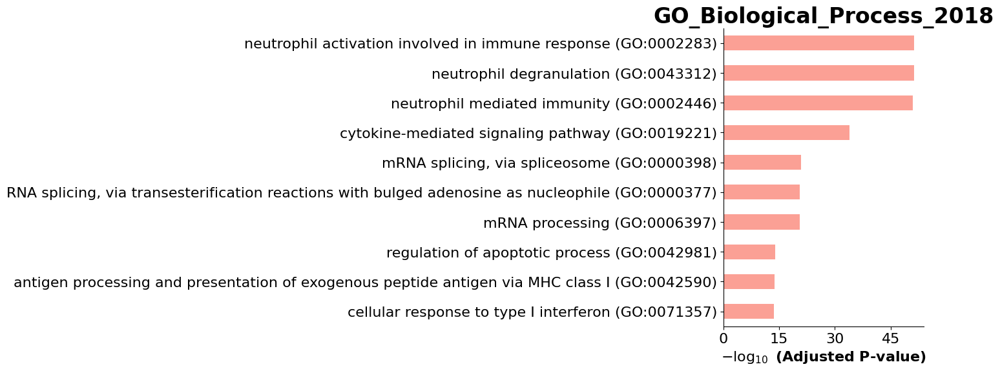

In [49]:
gseapy.barplot(enr_res.res2d,title='GO_Biological_Process_2018');

In [50]:
del vang, retrieved_vang
gc.collect();

### Analyze ennis

In [51]:
ennis = sc.read('../../../datasets/nuig/ennis.h5ad')
# ennis.X = ennis.layers['counts'].copy()
ennis

AnnData object with n_obs × n_vars = 111347 × 36601
    obs: 'donor', 'timepoint', 'sample', 'sample_ID', 'dataset', 'n_counts', 'CellType', 'celltype'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'CellType_colors', 'celltype_colors', 'hvg', 'log1p', 'neighbors', 'pca', 'sample_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [52]:
retrieved_ennis = merged_data[merged_data.obs['dataset'] == 'ennis']
retrieved_ennis

View of AnnData object with n_obs × n_vars = 111347 × 16723
    obs: 'dataset', 'sample', 'donor_status', 'donor', 'timepoint', 'celltype'
    uns: 'celltype_colors', 'dataset_colors', 'neighbors', 'timepoint_colors', 'umap', 't-test', 't-test_ov', 'wilcoxon', 'wilcoxon-2', 'wilcoxon-3', 'wilcoxon-4', 'logreg', 'dendrogram_timepoint'
    obsm: 'X_umap', 'X_pca'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

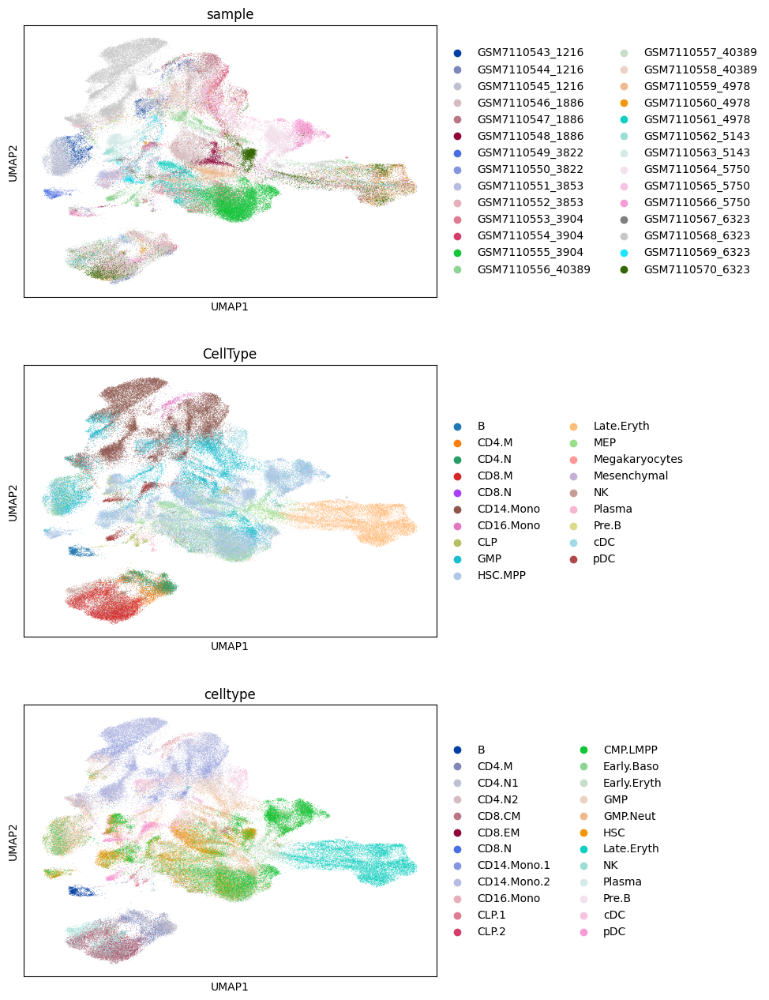

In [53]:
sc.pl.umap(ennis, color=['sample', 'CellType', 'celltype'], ncols=1)

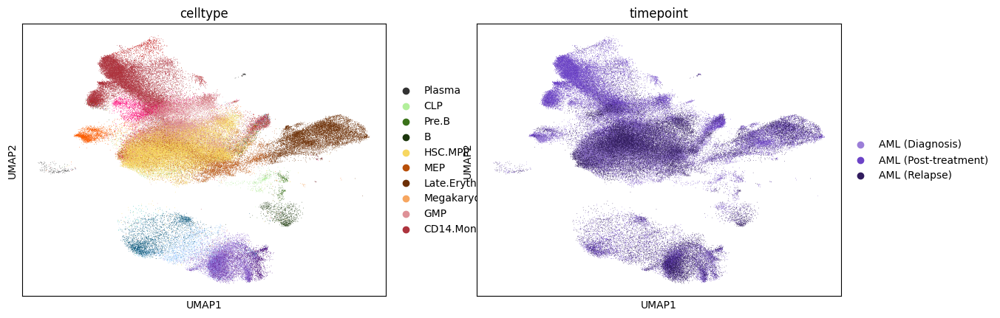

In [54]:
sc.pl.umap(retrieved_ennis, color=['celltype', 'timepoint'], ncols=2);

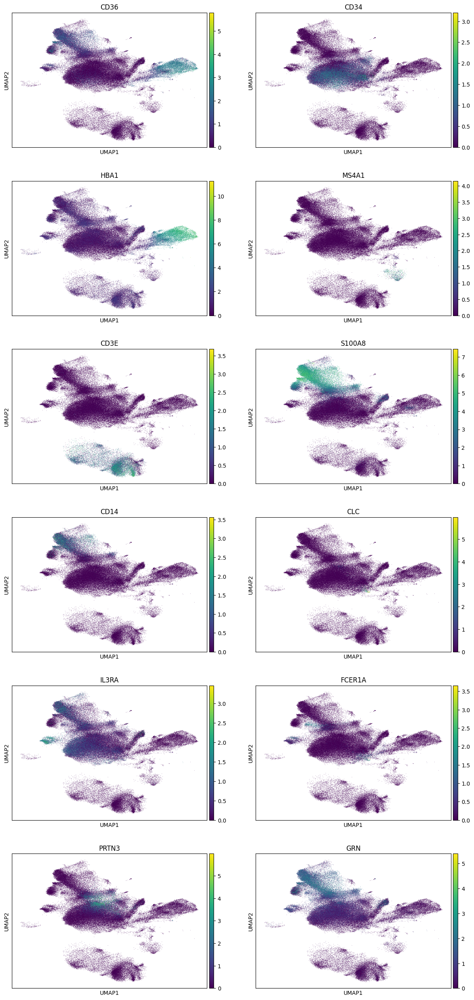

In [55]:
sc.pl.umap(retrieved_ennis, color=['CD36', 'CD34', 'HBA1', 'MS4A1', 'CD3E', 'S100A8',
                         'CD14', 'CLC', 'IL3RA', 'FCER1A','PRTN3', 'GRN'], ncols=2)

In [56]:
retrieved_ennis.obs['celltype'].value_counts()

celltype
HSC.MPP           31299
CD14.Mono         18951
GMP               16154
Late.Eryth        10184
MEP                9033
CD8.M              7235
cDC                3170
NK                 3167
CD4.N              2836
CD4.M              2701
pDC                2008
CD16.Mono          1504
CLP                1141
B                   876
Pre.B               587
Plasma              249
CD8.N               166
Megakaryocytes       49
Mesenchymal          37
Name: count, dtype: int64

In [57]:
retrieved_ennis.obs['timepoint'].value_counts()

timepoint
AML (Relapse)           46450
AML (Post-treatment)    33008
AML (Diagnosis)         31889
Name: count, dtype: int64

#### T-test

c:\Users\User\Desktop\MscThesis\venv\lib\site-packages\scanpy\tools\_rank_genes_groups.py:640: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


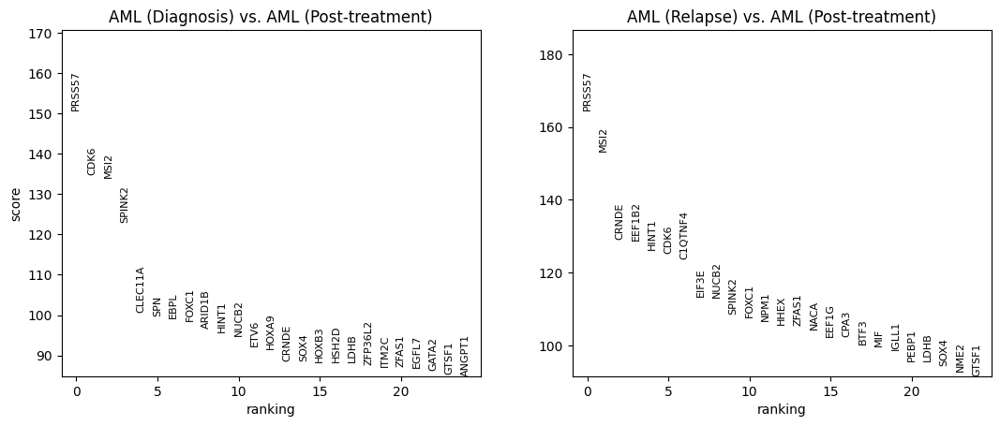

In [58]:
sc.tl.rank_genes_groups(retrieved_ennis, 'timepoint', method='t-test', key_added = "t-test", groups=["AML (Diagnosis)", "AML (Post-treatment)", "AML (Relapse)"],
                        reference="AML (Post-treatment)")
sc.pl.rank_genes_groups(retrieved_ennis, n_genes=25, sharey=False, key = "t-test")

#### T-test overestimated_variance

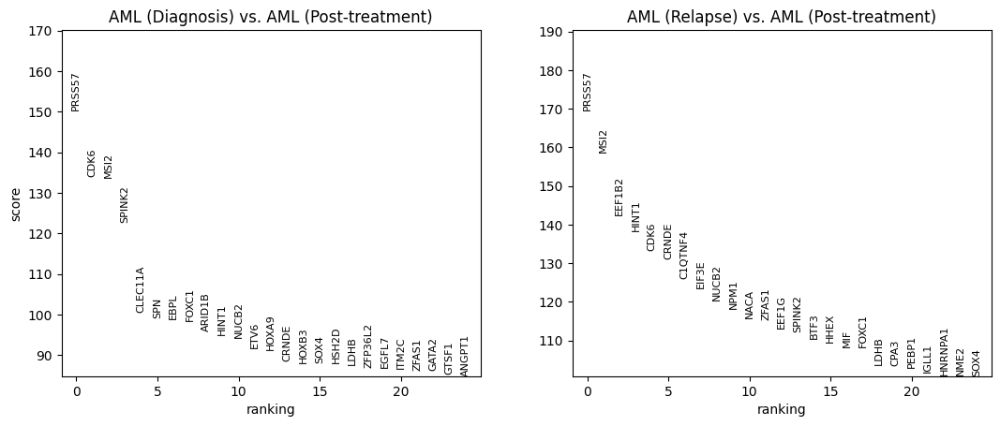

In [59]:
sc.tl.rank_genes_groups(retrieved_ennis, 'timepoint', method='t-test_overestim_var', key_added = "t-test_ov", groups=["AML (Diagnosis)", "AML (Post-treatment)", "AML (Relapse)"],
                        reference="AML (Post-treatment)")
sc.pl.rank_genes_groups(retrieved_ennis, n_genes=25, sharey=False, key = "t-test_ov")

#### Wilcoxon rank-sum

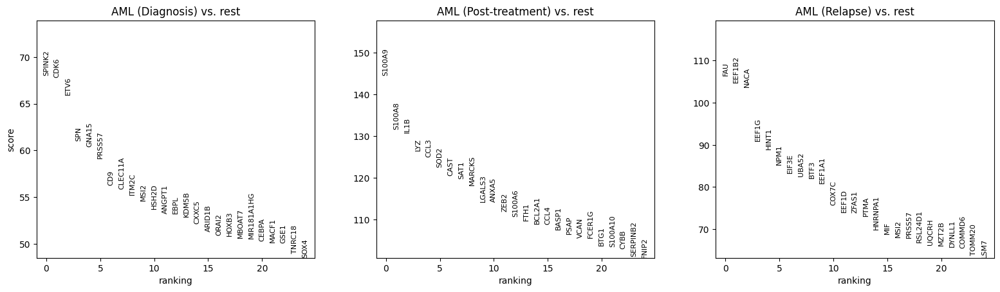

In [60]:
sc.tl.rank_genes_groups(retrieved_ennis, 'timepoint', method='wilcoxon', key_added = "wilcoxon")
sc.pl.rank_genes_groups(retrieved_ennis, n_genes=25, sharey=False, key="wilcoxon")

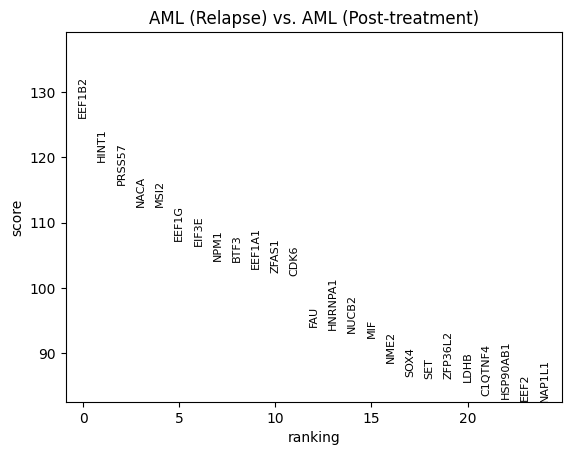

In [61]:
sc.tl.rank_genes_groups(retrieved_ennis, 'timepoint', method='wilcoxon', key_added = "wilcoxon-3", groups=["AML (Post-treatment)", "AML (Relapse)"],
                        reference="AML (Post-treatment)")
sc.pl.rank_genes_groups(retrieved_ennis, n_genes=25, sharey=False, key="wilcoxon-3")

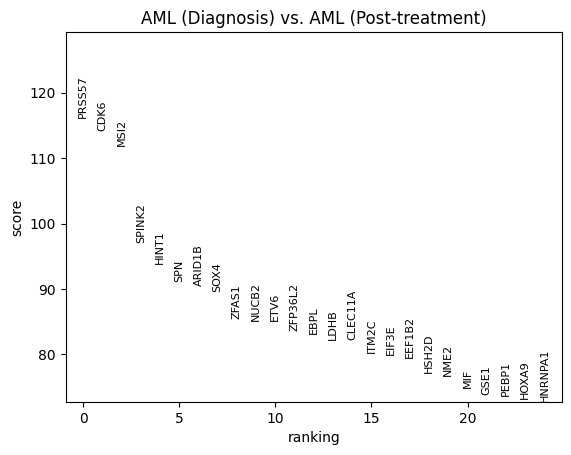

In [62]:
sc.tl.rank_genes_groups(retrieved_ennis, 'timepoint', method='wilcoxon', key_added = "wilcoxon-4", groups=["AML (Post-treatment)", "AML (Diagnosis)"],
                        reference="AML (Post-treatment)")
sc.pl.rank_genes_groups(retrieved_ennis, n_genes=25, sharey=False, key="wilcoxon-4")

#### GO Enrichment

In [63]:
gene_set_names = gseapy.get_library_name(organism='Human')
print(gene_set_names)

['ARCHS4_Cell-lines', 'ARCHS4_IDG_Coexp', 'ARCHS4_Kinases_Coexp', 'ARCHS4_TFs_Coexp', 'ARCHS4_Tissues', 'Achilles_fitness_decrease', 'Achilles_fitness_increase', 'Aging_Perturbations_from_GEO_down', 'Aging_Perturbations_from_GEO_up', 'Allen_Brain_Atlas_10x_scRNA_2021', 'Allen_Brain_Atlas_down', 'Allen_Brain_Atlas_up', 'Azimuth_2023', 'Azimuth_Cell_Types_2021', 'BioCarta_2013', 'BioCarta_2015', 'BioCarta_2016', 'BioPlanet_2019', 'BioPlex_2017', 'CCLE_Proteomics_2020', 'CORUM', 'COVID-19_Related_Gene_Sets', 'COVID-19_Related_Gene_Sets_2021', 'Cancer_Cell_Line_Encyclopedia', 'CellMarker_2024', 'CellMarker_Augmented_2021', 'ChEA_2013', 'ChEA_2015', 'ChEA_2016', 'ChEA_2022', 'Chromosome_Location', 'Chromosome_Location_hg19', 'ClinVar_2019', 'DSigDB', 'Data_Acquisition_Method_Most_Popular_Genes', 'DepMap_WG_CRISPR_Screens_Broad_CellLines_2019', 'DepMap_WG_CRISPR_Screens_Sanger_CellLines_2019', 'Descartes_Cell_Types_and_Tissue_2021', 'Diabetes_Perturbations_GEO_2022', 'DisGeNET', 'Disease_Per

In [64]:
glist1 = sc.get.rank_genes_groups_df(retrieved_ennis, group='AML (Relapse)', key='wilcoxon-3', log2fc_min=0.25, pval_cutoff=0.05)['names'].squeeze().str.strip().tolist()
glist2 = sc.get.rank_genes_groups_df(retrieved_ennis, group='AML (Diagnosis)', key='wilcoxon-4', log2fc_min=0.25, pval_cutoff=0.05)['names'].squeeze().str.strip().tolist()

In [65]:
enr_res1 = gseapy.enrichr(gene_list=glist1, organism='Human', gene_sets='GO_Biological_Process_2018', cutoff = 0.5)
enr_res1.results.head()

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,GO_Biological_Process_2018,mitochondrial translation (GO:0032543),82/107,4.515834e-32,1.086514e-28,0,0,11.265038,813.055609,MRPS17;MRPS15;MRPS16;MRPS14;MRPS11;MRPS12;MRPL...
1,GO_Biological_Process_2018,translational elongation (GO:0006414),81/105,4.660148e-32,1.086514e-28,0,0,11.589481,836.107739,MRPS17;MRPS15;MRPS16;MRPS14;MRPS11;MRPS12;MRPL...
2,GO_Biological_Process_2018,translational termination (GO:0006415),76/96,1.577210e-31,2.451509e-28,0,0,13.037756,924.696075,MRPS17;MRPS15;MRPS16;MRPS14;MRPS11;MRPS12;MRPL...
3,GO_Biological_Process_2018,mitochondrial translational elongation (GO:007...,71/87,4.051873e-31,4.723470e-28,0,0,15.212030,1064.552461,MRPS17;MRPS15;MRPS16;MRPS14;MRPS11;MRPS12;MRPL...
4,GO_Biological_Process_2018,mitochondrial translational termination (GO:00...,71/89,6.270543e-30,5.847908e-27,0,0,13.520050,909.111036,MRPS17;MRPS15;MRPS16;MRPS14;MRPS11;MRPS12;MRPL...


In [66]:
enr_res2 = gseapy.enrichr(gene_list=glist2, organism='Human', gene_sets='GO_Biological_Process_2018', cutoff = 0.5)
enr_res2.results.head()

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,GO_Biological_Process_2018,regulation of cellular macromolecule biosynthe...,294/631,2.032693e-26,9.750827e-23,0,0,2.420189,143.173175,CYFIP2;ATF2;ZNF175;NUP107;HDAC10;EHMT2;ZMYND8;...
1,GO_Biological_Process_2018,"regulation of transcription, DNA-templated (GO...",616/1598,2.498536e-25,5.992739e-22,0,0,1.772587,100.415133,ATF2;ZNF175;NUP107;EHMT1;ENO1;PHB2;ELK4;MYB;CR...
2,GO_Biological_Process_2018,mitochondrial translation (GO:0032543),80/107,1.191779e-24,1.905655e-21,0,0,8.062518,444.136672,MRPS15;MRPS16;MRPS14;GFM2;MRPS11;MRPS12;MRPL38...
3,GO_Biological_Process_2018,regulation of nucleic acid-templated transcrip...,278/607,1.261642e-23,1.513024e-20,0,0,2.338152,123.283863,ATF2;ZNF175;NUP107;HDAC10;ZMYND8;ZNF607;ZNF606...
4,GO_Biological_Process_2018,translational elongation (GO:0006414),77/105,7.040091e-23,6.754264e-20,0,0,7.478314,381.452599,MRPS15;MRPS16;MRPS14;MRPS11;MRPS12;MRPL38;MRPL...


c:\Users\User\Desktop\MscThesis\venv\lib\site-packages\gseapy\plot.py:689: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df[self.colname].replace(
c:\Users\User\Desktop\MscThesis\venv\lib\site-packages\gseapy\plot.py:689: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[self.colname].replace(


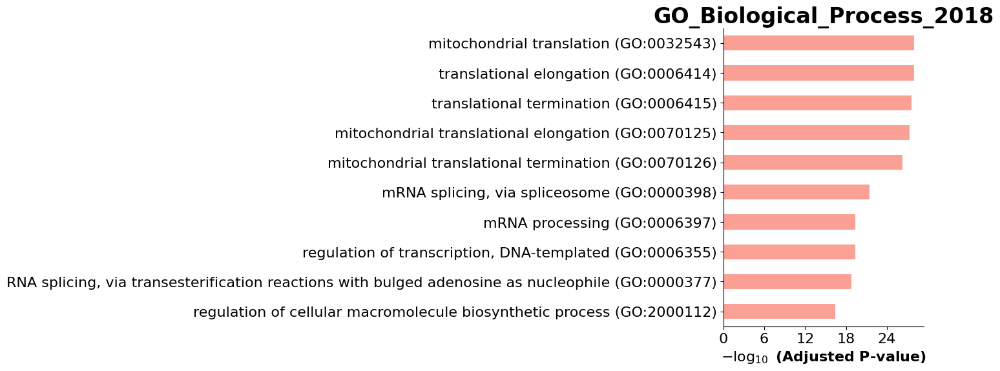

In [67]:
gseapy.barplot(enr_res1.res2d,title='GO_Biological_Process_2018');

c:\Users\User\Desktop\MscThesis\venv\lib\site-packages\gseapy\plot.py:689: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df[self.colname].replace(
c:\Users\User\Desktop\MscThesis\venv\lib\site-packages\gseapy\plot.py:689: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[self.colname].replace(


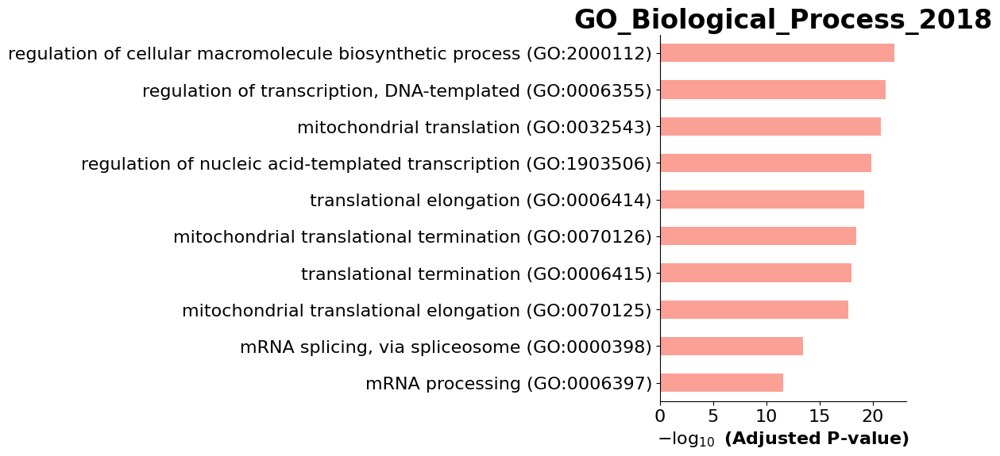

In [68]:
gseapy.barplot(enr_res2.res2d,title='GO_Biological_Process_2018');

### Analyze petti

In [69]:
pet = sc.read('../../../datasets/petti/petti.h5ad')
pet.obs['dataset'] = 'petti'
pet.obs['donor'] = pet.obs['sample'].str.extract(r'([0-9]+)')
# pet.X = pet.layers['counts'].copy()
pet

AnnData object with n_obs × n_vars = 103612 × 22164
    obs: 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'sample', 'timepoint', 'sample_ID', 'celltype', 'dataset', 'donor'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltype_colors', 'hvg', 'log1p', 'neighbors', 'pca', 'sample_colors', 'timepoint_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [70]:
retrieved_petti = merged_data[merged_data.obs['dataset'] == 'petti']
retrieved_petti

View of AnnData object with n_obs × n_vars = 100407 × 16723
    obs: 'dataset', 'sample', 'donor_status', 'donor', 'timepoint', 'celltype'
    uns: 'celltype_colors', 'dataset_colors', 'neighbors', 'timepoint_colors', 'umap', 't-test', 't-test_ov', 'wilcoxon', 'wilcoxon-2', 'wilcoxon-3', 'wilcoxon-4', 'logreg', 'dendrogram_timepoint'
    obsm: 'X_umap', 'X_pca'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

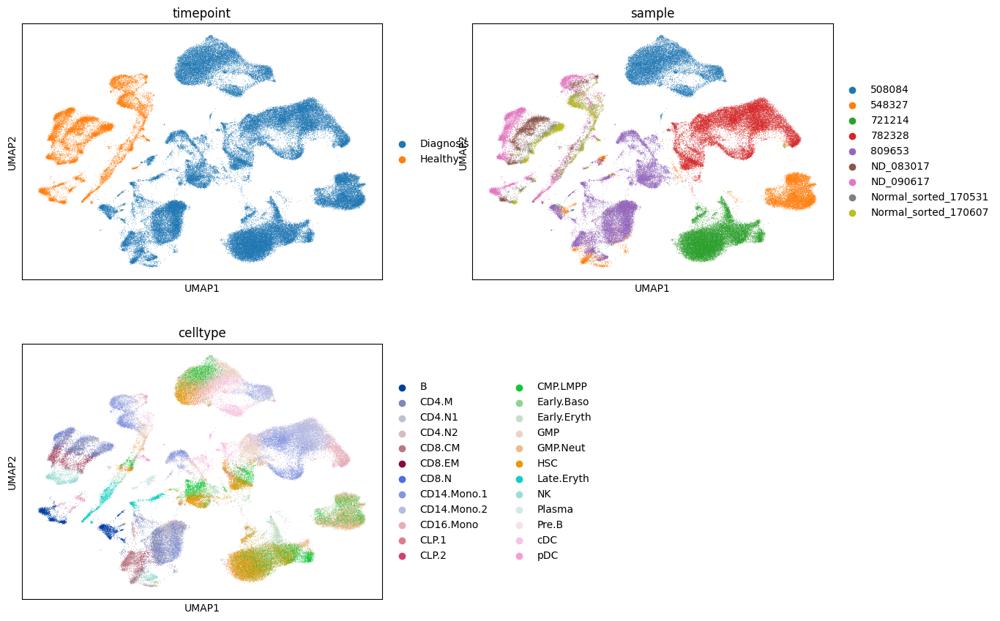

In [71]:
sc.pl.umap(pet, color=['timepoint', 'sample', 'celltype'], ncols=2)

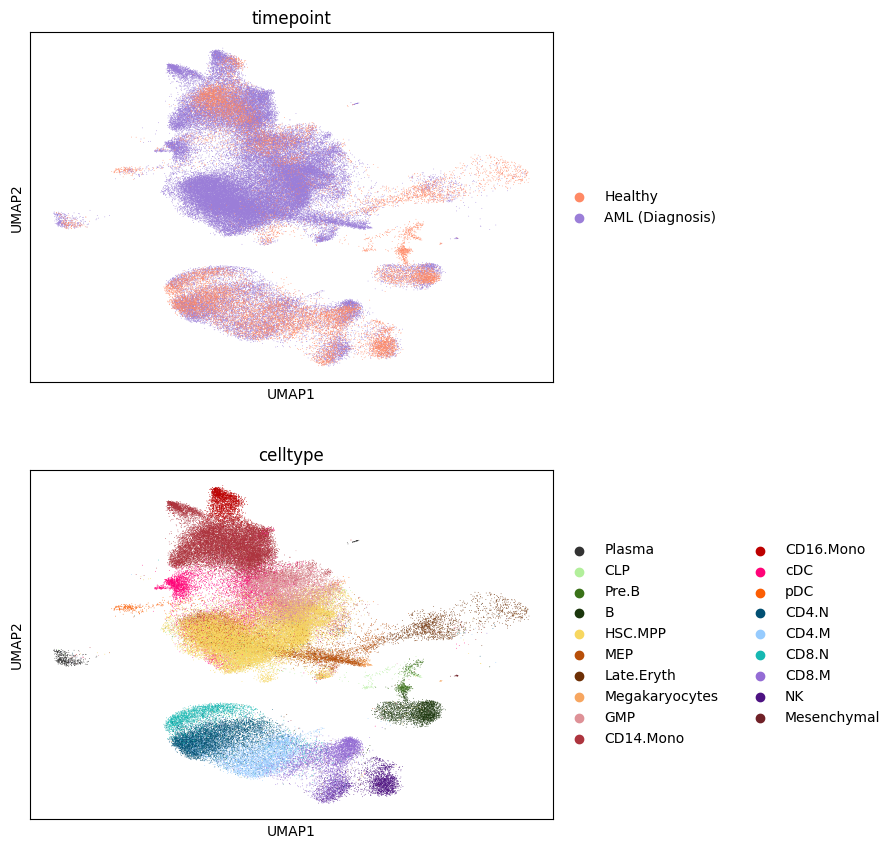

In [72]:
sc.pl.umap(retrieved_petti, color=['timepoint', 'celltype'], ncols=1)

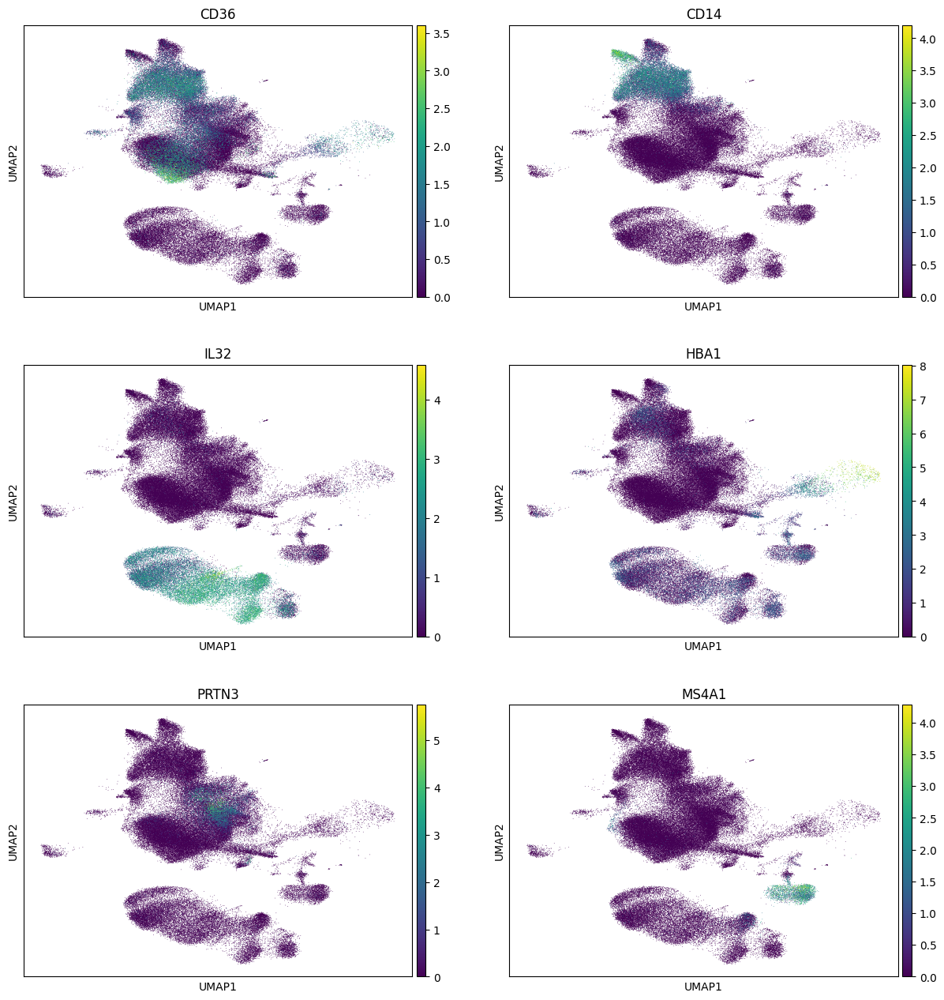

In [73]:
sc.pl.umap(retrieved_petti, color=['CD36', 'CD14', 'IL32', 'HBA1', 'PRTN3', 'MS4A1'], ncols=2)

In [74]:
retrieved_petti.obs['celltype'].value_counts()

celltype
HSC.MPP           29348
CD14.Mono         17441
GMP               11769
cDC                6958
CD4.N              6307
CD4.M              5413
MEP                4692
CD8.M              4594
CD16.Mono          2774
CD8.N              2712
B                  2590
NK                 2248
Late.Eryth         1537
CLP                 566
Plasma              473
Pre.B               435
pDC                 336
Megakaryocytes      196
Mesenchymal          18
Name: count, dtype: int64

In [75]:
retrieved_petti.obs['donor_status'].value_counts()

donor_status
AML        82236
Healthy    18171
Name: count, dtype: int64

#### T-test

c:\Users\User\Desktop\MscThesis\venv\lib\site-packages\scanpy\tools\_rank_genes_groups.py:640: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


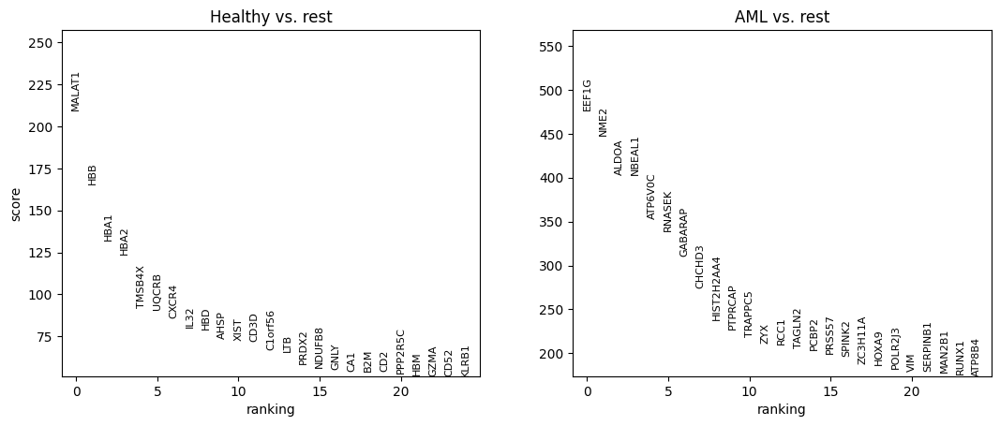

In [76]:
sc.tl.rank_genes_groups(retrieved_petti, 'donor_status', method='t-test', key_added = "t-test", groups=['Healthy', 'AML'])
sc.pl.rank_genes_groups(retrieved_petti, n_genes=25, sharey=False, key = "t-test")

#### T-test overestimated_variance

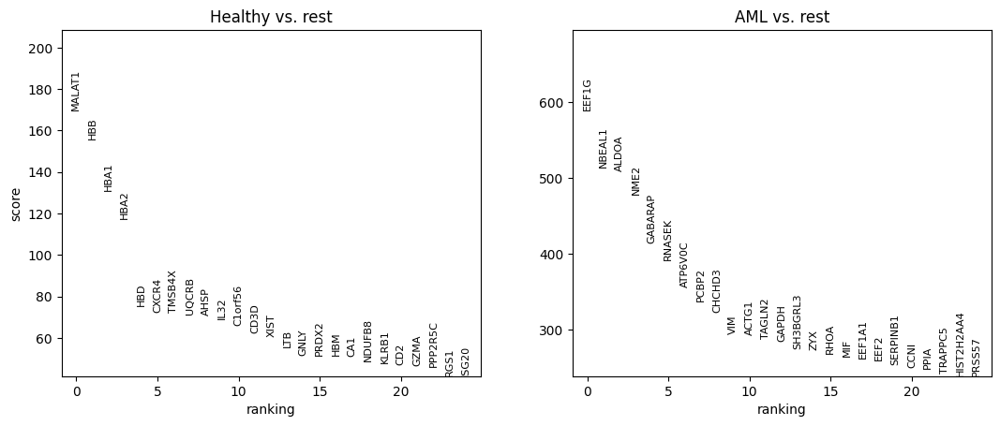

In [77]:
sc.tl.rank_genes_groups(retrieved_petti, 'donor_status', method='t-test_overestim_var', key_added = "t-test_ov", groups=['Healthy', 'AML'])
sc.pl.rank_genes_groups(retrieved_petti, n_genes=25, sharey=False, key = "t-test_ov")

#### Wilcoxon rank-sum

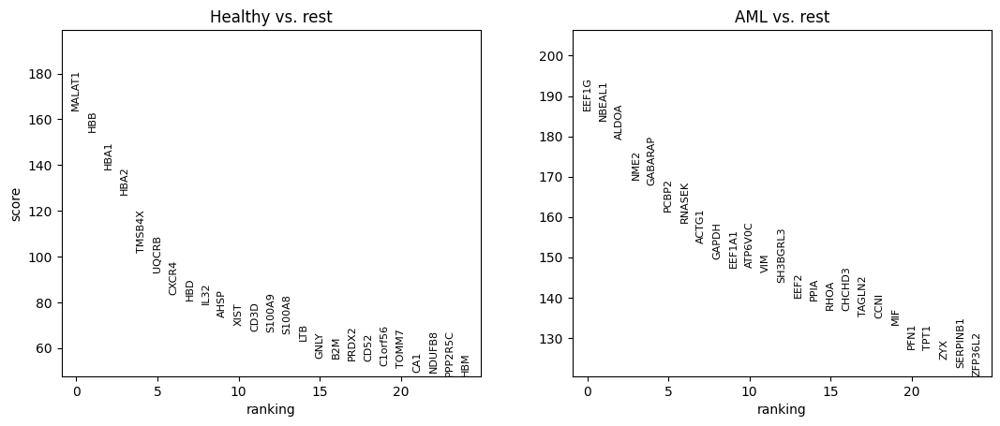

In [78]:
sc.tl.rank_genes_groups(retrieved_petti, 'donor_status', method='wilcoxon', key_added = "wilcoxon", groups=['Healthy', 'AML'])
sc.pl.rank_genes_groups(retrieved_petti, n_genes=25, sharey=False, key="wilcoxon")

#### Logistic regression test

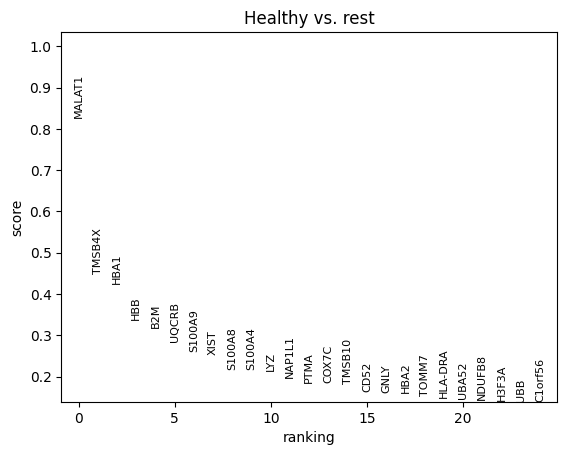

In [79]:
sc.tl.rank_genes_groups(retrieved_petti, 'donor_status', method='logreg',key_added = "logreg", groups=['Healthy', 'AML'])
sc.pl.rank_genes_groups(retrieved_petti, n_genes=25, sharey=False, key = "logreg")

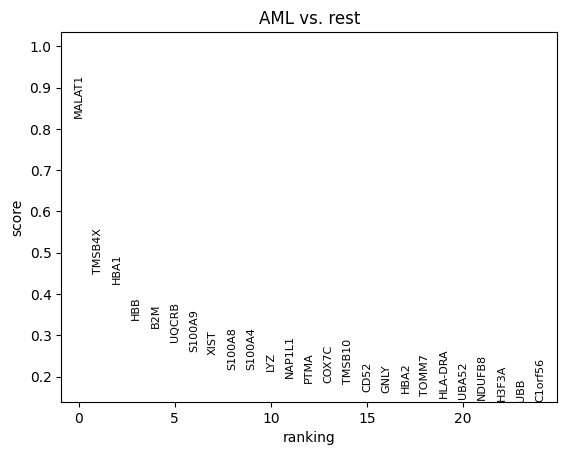

In [80]:
sc.tl.rank_genes_groups(retrieved_petti, 'donor_status', method='logreg',key_added = "logreg", groups=['AML', 'Healthy'])
sc.pl.rank_genes_groups(retrieved_petti, n_genes=25, sharey=False, key = "logreg")

#### wilcoxon results

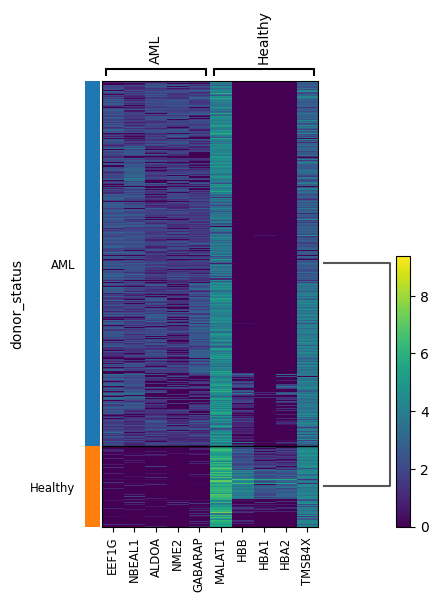

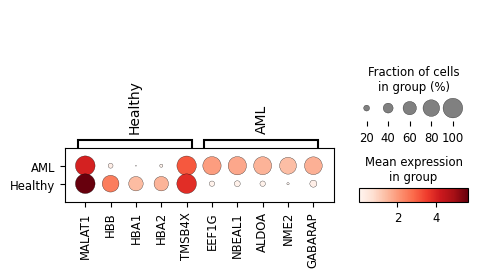

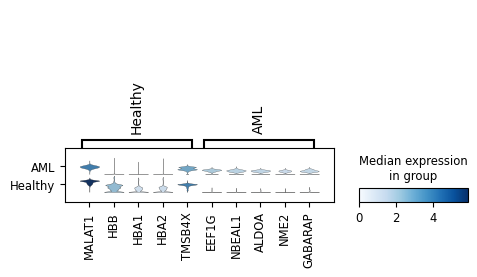

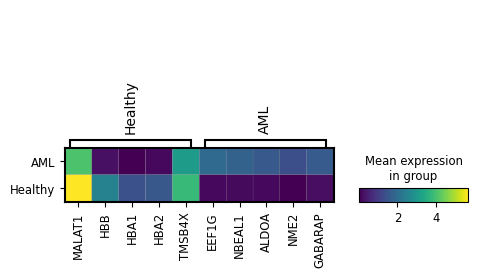

In [81]:
sc.pl.rank_genes_groups_heatmap(retrieved_petti, n_genes=5, key="wilcoxon", groupby="donor_status", show_gene_labels=True)
sc.pl.rank_genes_groups_dotplot(retrieved_petti, n_genes=5, key="wilcoxon", groupby="donor_status")
sc.pl.rank_genes_groups_stacked_violin(retrieved_petti, n_genes=5, key="wilcoxon", groupby="donor_status")
sc.pl.rank_genes_groups_matrixplot(retrieved_petti, n_genes=5, key="wilcoxon", groupby="donor_status")

#### GO Enrichment

In [82]:
gene_set_names = gseapy.get_library_name(organism='Human')
print(gene_set_names)

['ARCHS4_Cell-lines', 'ARCHS4_IDG_Coexp', 'ARCHS4_Kinases_Coexp', 'ARCHS4_TFs_Coexp', 'ARCHS4_Tissues', 'Achilles_fitness_decrease', 'Achilles_fitness_increase', 'Aging_Perturbations_from_GEO_down', 'Aging_Perturbations_from_GEO_up', 'Allen_Brain_Atlas_10x_scRNA_2021', 'Allen_Brain_Atlas_down', 'Allen_Brain_Atlas_up', 'Azimuth_2023', 'Azimuth_Cell_Types_2021', 'BioCarta_2013', 'BioCarta_2015', 'BioCarta_2016', 'BioPlanet_2019', 'BioPlex_2017', 'CCLE_Proteomics_2020', 'CORUM', 'COVID-19_Related_Gene_Sets', 'COVID-19_Related_Gene_Sets_2021', 'Cancer_Cell_Line_Encyclopedia', 'CellMarker_2024', 'CellMarker_Augmented_2021', 'ChEA_2013', 'ChEA_2015', 'ChEA_2016', 'ChEA_2022', 'Chromosome_Location', 'Chromosome_Location_hg19', 'ClinVar_2019', 'DSigDB', 'Data_Acquisition_Method_Most_Popular_Genes', 'DepMap_WG_CRISPR_Screens_Broad_CellLines_2019', 'DepMap_WG_CRISPR_Screens_Sanger_CellLines_2019', 'Descartes_Cell_Types_and_Tissue_2021', 'Diabetes_Perturbations_GEO_2022', 'DisGeNET', 'Disease_Per

In [83]:
glist = sc.get.rank_genes_groups_df(retrieved_petti, group='AML', key='wilcoxon', log2fc_min=0.25, pval_cutoff=0.05)['names'].squeeze().str.strip().tolist()

In [84]:
enr_res = gseapy.enrichr(gene_list=glist, organism='Human', gene_sets='GO_Biological_Process_2018', cutoff = 0.5)
enr_res.results.head()

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,GO_Biological_Process_2018,"regulation of transcription, DNA-templated (GO...",966/1598,2.929051e-37,1.470970e-33,0,0,1.953028,164.290571,ATF2;SPI1;NUP107;EHMT1;RBPJ;PSMD9;AKT1;ZNF17;Z...
1,GO_Biological_Process_2018,neutrophil activation involved in immune respo...,354/483,9.004726e-37,2.261087e-33,0,0,3.418313,283.712795,CDA;CYFIP1;PSMD6;PSMD7;PNP;PSMD2;ANPEP;FTH1;PS...
2,GO_Biological_Process_2018,neutrophil degranulation (GO:0043312),351/479,1.941099e-36,3.249400e-33,0,0,3.414960,280.811526,CDA;CYFIP1;PSMD6;PSMD7;PNP;PSMD2;ANPEP;FTH1;PS...
3,GO_Biological_Process_2018,mRNA processing (GO:0006397),230/283,3.667159e-36,4.604119e-33,0,0,5.367052,437.917366,CCNH;EIF4A3;HNRNPU;GPATCH1;WDR83;HNRNPR;CCAR1;...
4,GO_Biological_Process_2018,"mRNA splicing, via spliceosome (GO:0000398)",215/261,1.379915e-35,1.343124e-32,0,0,5.774373,463.500041,EIF4A3;HNRNPU;GPATCH1;WDR83;HNRNPR;CCAR1;PNN;S...


c:\Users\User\Desktop\MscThesis\venv\lib\site-packages\gseapy\plot.py:689: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df[self.colname].replace(
c:\Users\User\Desktop\MscThesis\venv\lib\site-packages\gseapy\plot.py:689: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[self.colname].replace(


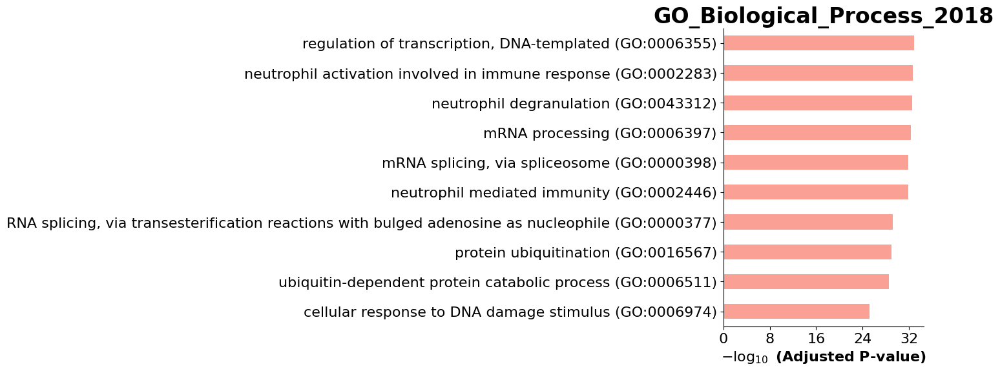

In [85]:
gseapy.barplot(enr_res.res2d,title='GO_Biological_Process_2018');

In [86]:
del pet, retrieved_petti
gc.collect();

#### Analyze oetjen

In [87]:
oet = sc.read('../../../datasets/oetjen/oetjen.h5ad')
oet.obs['dataset'] = 'oetjen'
oet.obs['donor'] = oet.obs['patient']
oet.obs['timepoint'] = 'Healthy'
# oet.X = oet.layers['counts'].copy()
oet

AnnData object with n_obs × n_vars = 73050 × 33694
    obs: 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'sample', 'patient', 'sample_ID', 'celltype', 'dataset', 'donor', 'timepoint'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltype_colors', 'hvg', 'log1p', 'neighbors', 'patient_colors', 'pca', 'sample_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [88]:
retrieved_oet = merged_data[merged_data.obs['dataset'] == 'oetjen']
retrieved_oet

View of AnnData object with n_obs × n_vars = 69264 × 16723
    obs: 'dataset', 'sample', 'donor_status', 'donor', 'timepoint', 'celltype'
    uns: 'celltype_colors', 'dataset_colors', 'neighbors', 'timepoint_colors', 'umap', 't-test', 't-test_ov', 'wilcoxon', 'wilcoxon-2', 'wilcoxon-3', 'wilcoxon-4', 'logreg', 'dendrogram_timepoint'
    obsm: 'X_umap', 'X_pca'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

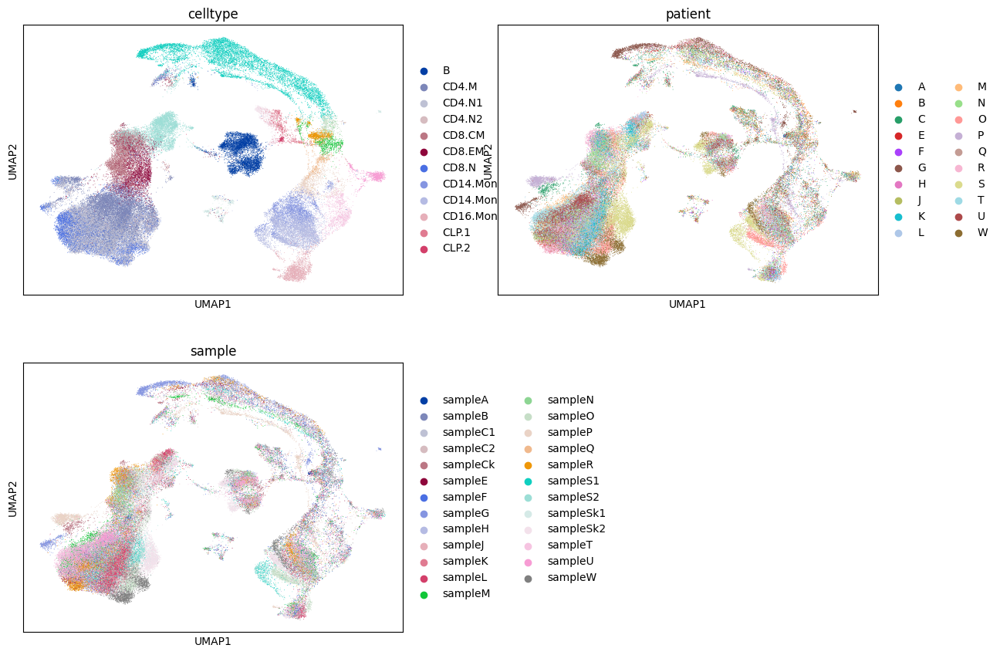

In [89]:
sc.pl.umap(oet, color=['celltype', 'patient', 'sample'], ncols=2)

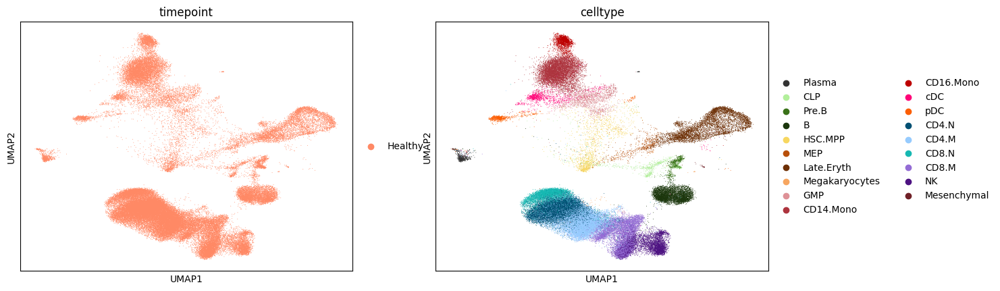

In [90]:
sc.pl.umap(retrieved_oet, color=['timepoint', 'celltype'], ncols=2)

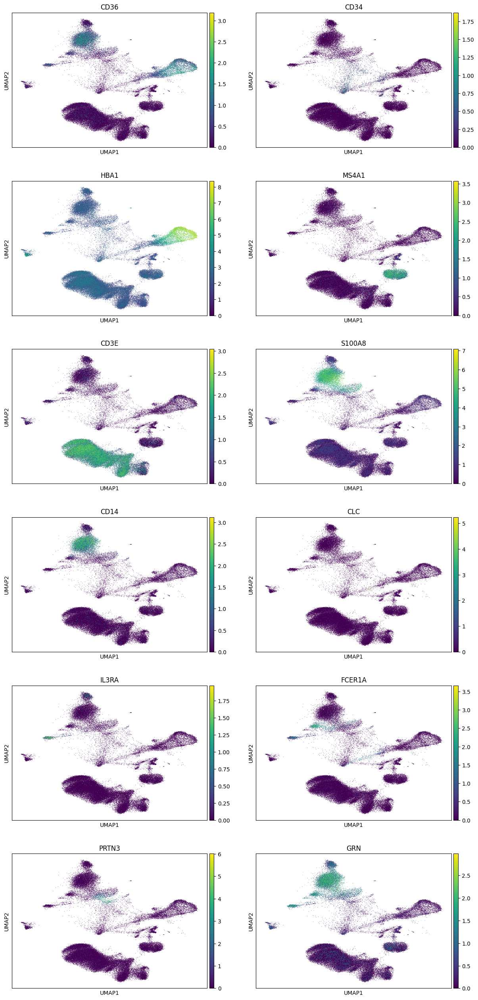

In [91]:
sc.pl.umap(retrieved_oet, color=['CD36', 'CD34', 'HBA1', 'MS4A1', 'CD3E', 'S100A8',
                         'CD14', 'CLC', 'IL3RA', 'FCER1A','PRTN3', 'GRN'], ncols=2)

In [92]:
retrieved_oet.obs['celltype'].value_counts()

celltype
CD4.M             13428
CD4.N             12609
CD8.M              7487
CD14.Mono          7211
Late.Eryth         5302
CD8.N              5032
B                  4536
NK                 4340
CD16.Mono          1700
GMP                1513
HSC.MPP            1500
cDC                1093
CLP                 920
pDC                 737
Pre.B               656
Plasma              572
MEP                 556
Megakaryocytes       47
Mesenchymal          25
Name: count, dtype: int64

In [93]:
retrieved_oet.obs['donor_status'].value_counts()

donor_status
Healthy    69264
Name: count, dtype: int64

In [94]:
retrieved_oet.obs['donor'].value_counts()

donor
S    8877
K    6760
O    4785
L    4140
C    4115
N    4056
U    3542
T    3523
H    3403
F    3289
W    3200
B    2765
R    2646
J    2575
A    2390
M    2388
P    2229
E    1957
G    1516
Q    1108
Name: count, dtype: int64

In [95]:
del oet, retrieved_oet
gc.collect();